<h1 align="center">Communication Systems</h1>
<h4 align="center">Dr. Pakravan</h4>
<h4 align="center">Sharif University of Technology, Winter 2024</h4>
<h4 align="center">Project</h4>
<h4 align="center"> Seyed Hamid Ghasemi </h4>
<h4 align="center"> 400109768 </h4>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft, fftfreq
from scipy.fftpack import fft, ifft,fftfreq,ifftshift
from scipy.signal import fftconvolve

. <hr> <hr> <hr> <hr>

# <font color='red'>Part2: Implementation of blocks </font>


## <font color='Green'> 2.1 </font>:

In [2]:
def Divide(sequence):

    if len(sequence)%2 != 0 :
        return None

    even_sequence = sequence[::2]  # Get elements at even indices
    odd_sequence = sequence[1::2]   # Get elements at odd indices

    return even_sequence, odd_sequence

In [4]:
def Combine(even_sequence, odd_sequence):
    n = len(even_sequence) + len(odd_sequence)
    original_array = [0] * n
    original_array[::2] = even_sequence  # Place even indices in the original array
    original_array[1::2] = odd_sequence   # Place odd indices in the original array
    return original_array

**test:**

In [7]:
original_seq = [0,1,1,1,0,0,0,1,1,0,1,0,1,0,0,0]
print("Original sequence: ",original_seq)
even_sequence, odd_sequence = Divide(original_seq)
print()
print("even part: ",even_sequence)
print("odd part: ",odd_sequence)
print()
print("reconstruction: ",Combine(even_sequence, odd_sequence))

Original sequence:  [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]

even part:  [0, 1, 0, 0, 1, 1, 1, 0]
odd part:  [1, 1, 0, 1, 0, 0, 0, 0]

reconstruction:  [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]


. <hr>

## <font color='Green'> 2.2 </font>:


In [5]:
def PulseShaping(sequence, pulse_0, pulse_1):
    signal = []
    for i in sequence:
        if i==0:
            signal.extend(pulse_0)
        else:
            signal.extend(pulse_1)

    return signal

**test:**

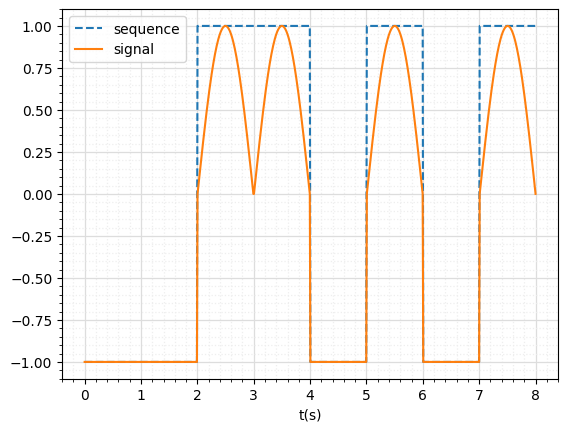

In [12]:
T = 1
N0 = 100
t = np.linspace(0,T/2,N0)
pulse_1 = np.power(np.sin(2*np.pi*t),1)
pulse_0 = [-1] * N0

prob = 0.5
seq = np.random.choice([0, 1], size=8, p=[1 - prob, prob])

seq_signal = []
for i in seq:
    seq_signal.extend([2*i-1] * N0)

signal = PulseShaping(seq, pulse_0, pulse_1)

time = np.linspace(0,len(seq)*T,len(seq)*N0)

plt.plot(time, seq_signal , label='sequence', linestyle='--')
plt.plot(time, signal, label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

. <hr>

## <font color='Green'> 2.3 </font>:


In [6]:
def AnalogMod(x1, x2, fs, fc):
    time = np.linspace(0,(len(x1))/fs,len(x1),endpoint=False)
    xc = x1 * np.cos(2*np.pi*fc*time) + x2 * np.sin(2*np.pi*fc*time)
    return xc

**test:**

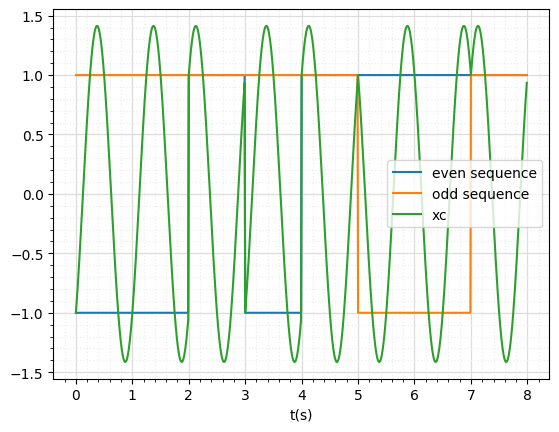

In [15]:
fs = 100
fc = 1

T = 1
N0 = int(T*fs)
t = np.linspace(0,T,N0,endpoint=False)


pulse_1 = [1] * N0
pulse_0 = [-1] * N0
prob = 0.5

seq1 = np.random.choice([0, 1], size=8, p=[1 - prob, prob])
signal1 = PulseShaping(seq1, pulse_0, pulse_1)

seq2 = np.random.choice([0, 1], size=8, p=[1 - prob, prob])
signal2 = PulseShaping(seq2, pulse_0, pulse_1)

xc = AnalogMod(signal1,signal2,fs,fc)

time = np.linspace(0,len(seq1)*T,len(seq)*N0,endpoint=False)

plt.plot(time, signal1 , label='even sequence')
plt.plot(time, signal2 , label='odd sequence')
plt.plot(time, xc , label='xc')

plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

. <hr>

## <font color='Green'> 2.4 </font>:


In [7]:
def Channel(signal, fs, f_center, Bw):
    if fs<= Bw/2:
        print("this is low pass :(")
        return None

    mf = fft(signal)/len(signal)
    freq = fftfreq(len(signal), 1 / fs)
    new_freq = np.fft.fftshift(freq)
    new_mf = np.fft.fftshift(mf)

    bandPass_filter = np.heaviside(new_freq+Bw/2-f_center,1)-np.heaviside(new_freq-Bw/2-f_center,1) +                                np.heaviside(new_freq+Bw/2+f_center,1)-np.heaviside(new_freq-Bw/2+f_center,1)
    filtered = new_mf*bandPass_filter

    """
    # Plot the FFT
    plt.plot(new_freq,bandPass_filter)
    plt.xlabel('Freq (Hz)')
    plt.title('bp filter')
    plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
    plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
    plt.minorticks_on()
    plt.xlim(-15000,15000)
    plt.show()

    plt.plot(new_freq,np.abs(new_mf))
    plt.xlabel('Freq (Hz)')
    plt.title('ORIGINAL SIGNAL')
    plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
    plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
    plt.minorticks_on()
    plt.xlim(-15000,15000)
    plt.show()

    plt.plot(new_freq,np.abs(filtered))
    plt.xlabel('Freq (Hz)')
    plt.title('FILTERED SIGNAL')
    plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
    plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
    plt.minorticks_on()
    plt.xlim(-15000,15000)
    plt.show()
    """



    filtered_signal = ifft(ifftshift(filtered))*len(signal)

    return filtered_signal

**test:**

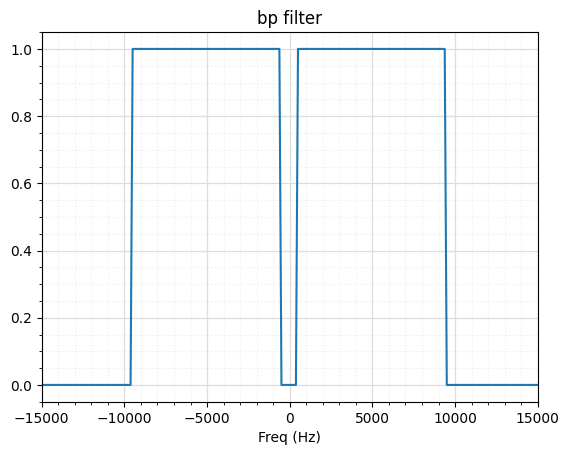

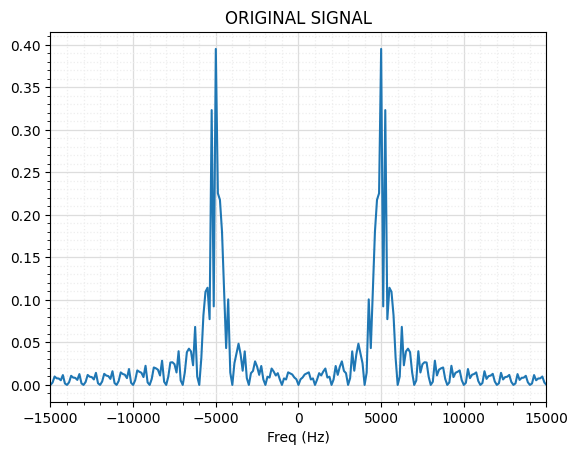

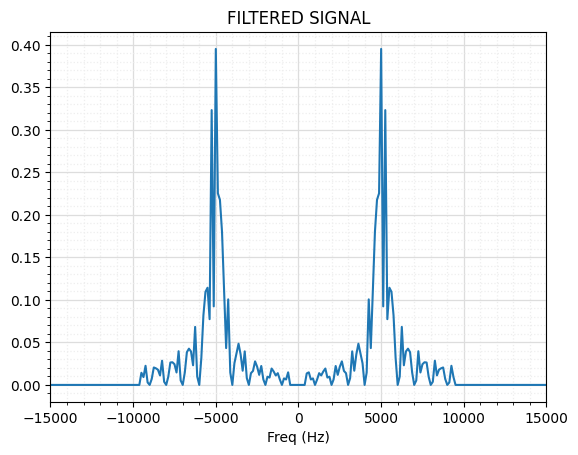

"\nplt.plot(time, xc , label='xc')\nplt.legend()\nplt.xlabel('t(s)')\nplt.grid(which='major', color='#DDDDDD', linewidth=0.9)\nplt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)\nplt.minorticks_on()\nplt.show()\n\nplt.plot(time, filtered_xc , label='filtered_xc')\nplt.legend()\nplt.xlabel('t(s)')\nplt.grid(which='major', color='#DDDDDD', linewidth=0.9)\nplt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)\nplt.minorticks_on()\nplt.show()\n"

In [18]:
fs = 100000
fc = 5000

T = 0.001
N0 = int(T*fs)
t = np.linspace(0,T,N0,endpoint=False)


pulse_1 = [1] * N0
pulse_0 = [-1] * N0
prob = 0.5

seq1 = np.random.choice([0, 1], size=8, p=[1 - prob, prob])
signal1 = PulseShaping(seq1, pulse_0, pulse_1)

seq2 = np.random.choice([0, 1], size=8, p=[1 - prob, prob])
signal2 = PulseShaping(seq2, pulse_0, pulse_1)

xc = AnalogMod(signal1,signal2,fs,fc)

f_center = 5000
BW = 9000
filtered_xc = Channel(xc,fs,f_center,BW)

time = np.linspace(0,len(seq1)*T,len(seq)*N0,endpoint=False)

"""
plt.plot(time, xc , label='xc')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.show()

plt.plot(time, filtered_xc , label='filtered_xc')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.show()
"""

. <hr>

## <font color='Green'> 2.5 </font>:


In [8]:
def ideal_LP(signal, Bw):
    #print("g0")
    mf = fft(signal)/len(signal)
    freq = fftfreq(len(signal), 1 / fs)
    #print("g1")
    new_freq = np.fft.fftshift(freq)
    #print("g2")
    new_mf = np.fft.fftshift(mf)
    #print("g3")
    lowPass_filter = np.heaviside(new_freq+Bw/2,1)-np.heaviside(new_freq-Bw/2,1)
    filtered = new_mf*lowPass_filter
    #print("g4")
    filtered_signal = ifft(ifftshift(filtered))*len(signal)
    #print("g5")

    """
    # Plot the FFT
    plt.plot(new_freq,lowPass_filter)
    plt.xlabel('Freq (Hz)')
    plt.title('bp filter')
    plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
    plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
    plt.minorticks_on()
    plt.show()

    plt.plot(new_freq,np.abs(new_mf))
    plt.xlabel('Freq (Hz)')
    plt.title('ORIGINAL SIGNAL')
    plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
    plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
    plt.minorticks_on()
    plt.show()

    plt.plot(new_freq,np.abs(filtered))
    plt.xlabel('Freq (Hz)')
    plt.title('FILTERED SIGNAL')
    plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
    plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
    plt.minorticks_on()
    plt.show()
    """


    return filtered_signal

In [9]:
def AnalogDemod(xc, fs, fc, Bw):
    time = np.linspace(0,(len(xc))/fs,len(xc),endpoint=False)
    yy1 = xc * np.cos(2*np.pi*fc*time)
    yy2 = xc * np.sin(2*np.pi*fc*time)

    y1 = ideal_LP(yy1, Bw)
    y2 = ideal_LP(yy2, Bw)
    return y1,y2

**test:**

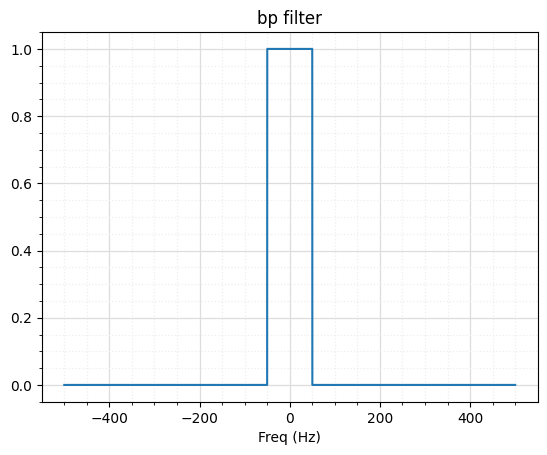

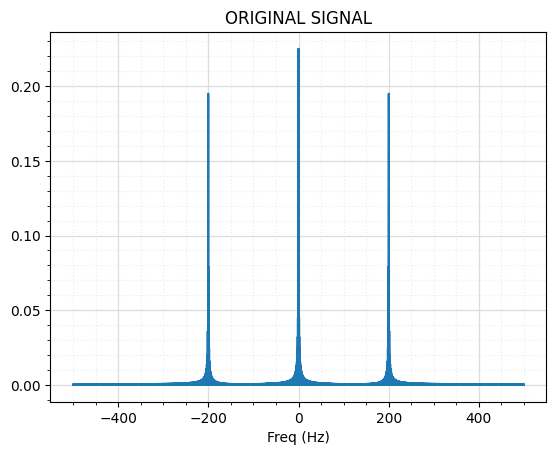

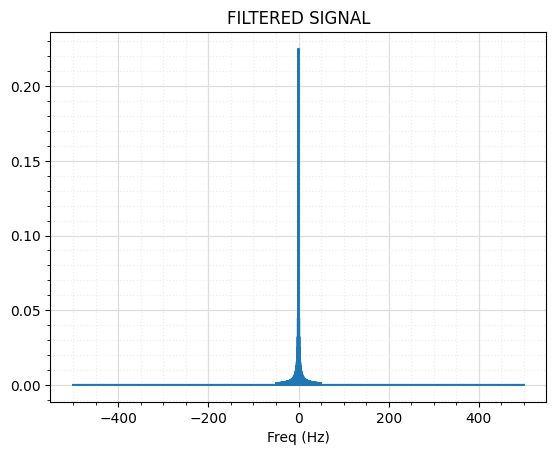

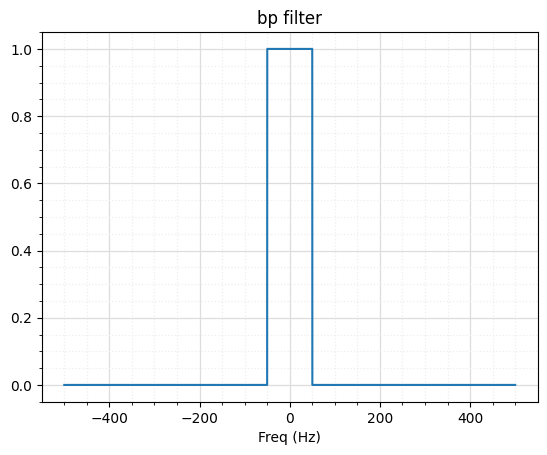

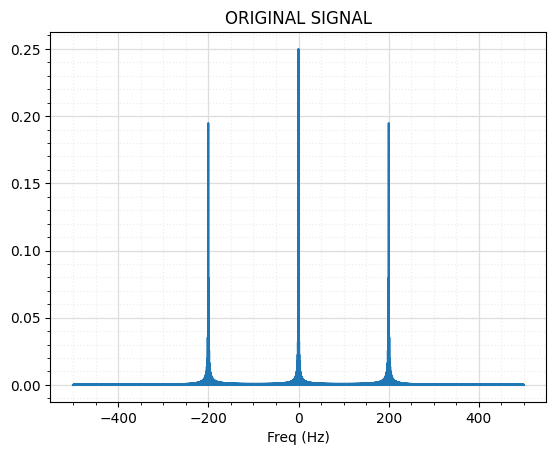

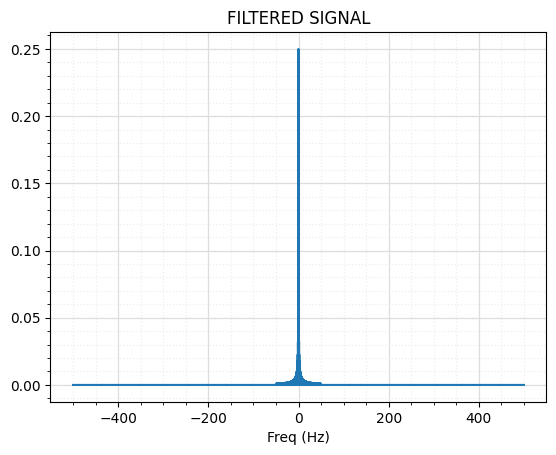

In [24]:
fs = 1000
fc = 100

T = 1
N0 = int(T*fs)
t = np.linspace(0,T,N0,endpoint=False)


pulse_1 = [1] * N0
pulse_0 = [-1] * N0
prob = 0.5

seq1 = np.random.choice([0, 1], size=8, p=[1 - prob, prob])
signal1 = PulseShaping(seq1, pulse_0, pulse_1)

seq2 = np.random.choice([0, 1], size=8, p=[1 - prob, prob])
signal2 = PulseShaping(seq2, pulse_0, pulse_1)

xc = AnalogMod(signal1,signal2,fs,fc)

time = np.linspace(0,len(seq1)*T,len(seq)*N0,endpoint=False)

"""
plt.plot(time, signal1 , label='signal1')
plt.plot(time, signal2 , label='signal1')
plt.plot(time, xc , label='xc')

plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.show()
"""
y1,y2 = AnalogDemod(xc,fs,fc,100)


. <hr>

## <font color='Green'> 2.6 </font>:


In [10]:
def MatchedFilt(y, pulse_0, pulse_1):
    #print("step0")
    pulse_0 = np.array(pulse_0)
    pulse_1 = np.array(pulse_1)

    pulse_0_flipped = np.flip(pulse_0, axis=0)
    pulse_1_flipped = np.flip(pulse_1, axis=0)

    Energy_p0 = np.sum(pulse_0 * pulse_0)
    Energy_p1 = np.sum(pulse_1 * pulse_1)
    Energy_p1p0 = np.sum(pulse_0 * pulse_1)

    threshold_0 = (Energy_p0+Energy_p1p0)/2
    threshold_1 = (Energy_p1+Energy_p1p0)/2


    output_pulse0 = fftconvolve(y,pulse_0_flipped)
    output_pulse1 = fftconvolve(y,pulse_1_flipped)
    N = len(pulse_0)
    n_bits = int(len(y)/N)

    predicted_bits = np.zeros(n_bits)
    #print("step2")

    for i in range(n_bits):

        if ((output_pulse0[i*N-1+N] > threshold_0) & (output_pulse1[i*N-1+N] < threshold_1) ):
            predicted_bits[i] = 0
        elif ((output_pulse0[i*N-1+N] < threshold_0) & (output_pulse1[i*N-1+N] > threshold_1) ):
            predicted_bits[i] = 1
        else:
            predicted_bits[i] = 2 #error

    #print("step3")

    #print("step3")

    return output_pulse0, output_pulse1, predicted_bits.astype(int)




**test:**

In [28]:
a_ideal = [1,1,-1,-1,-1,-1,1,1,1,1,-1,-1]


p1 = [1,1]
p0 = [-1,-1]

output_pulse0, output_pulse1, predicted_bits = MatchedFilt(a_ideal,p0,p1)
print(output_pulse0)
print(output_pulse1)
print(predicted_bits)

[-1.00000000e+00 -2.00000000e+00  1.18423789e-16  2.00000000e+00
  2.00000000e+00  2.00000000e+00 -1.18423789e-16 -2.00000000e+00
 -2.00000000e+00 -2.00000000e+00  1.18423789e-16  2.00000000e+00
  1.00000000e+00]
[ 1.00000000e+00  2.00000000e+00 -1.18423789e-16 -2.00000000e+00
 -2.00000000e+00 -2.00000000e+00  1.18423789e-16  2.00000000e+00
  2.00000000e+00  2.00000000e+00 -1.18423789e-16 -2.00000000e+00
 -1.00000000e+00]
[1 0 0 1 1 0]


. <hr> <hr> <hr> <hr>




# <font color='red'>Part3: Transmission of a random sequence of zeros and ones
 </font>

In [11]:
fs = 1000000
T = 0.01
fc = 10000
f_center = 10000
Bw = 1000

In [12]:
def error_prob(original_seq, predicted_seq):
    n_errors = 0
    for i in range(len(original_seq)):
        if original_seq[i] != predicted_seq[i]:
            n_errors += 1
    #print("n_errors:",n_errors)
    return n_errors/len(original_seq)

## <font color='Green'> 3.1 </font>:

### <font color='Orange'> 3.1.a </font>:

In [54]:
l_seq = 1024
prob = 0.5

start_disp = int(l_seq/4-l_seq/8)
end_disp = start_disp+10

original_seq = np.random.choice([0, 1], size=l_seq, p=[1 - prob, prob])
even_sequence, odd_sequence = Divide(original_seq)

# combine_res = Combine(even_sequence, odd_sequence)

N0 = int(T*fs)

pulse_1 = [1] * N0
pulse_0 = [-1] * N0

x1 = PulseShaping(even_sequence, pulse_0, pulse_1)
x2 = PulseShaping(odd_sequence, pulse_0, pulse_1)

time = np.linspace(0,len(even_sequence)*T,len(even_sequence)*N0, endpoint=False)

even_signal = []
odd_signal = []

for i in range(len(even_sequence)):
    even_signal.extend([2*even_sequence[i]-1] * N0)
    odd_signal.extend([2*odd_sequence[i]-1] * N0)

xc = AnalogMod(x1,x2,fs,fc)

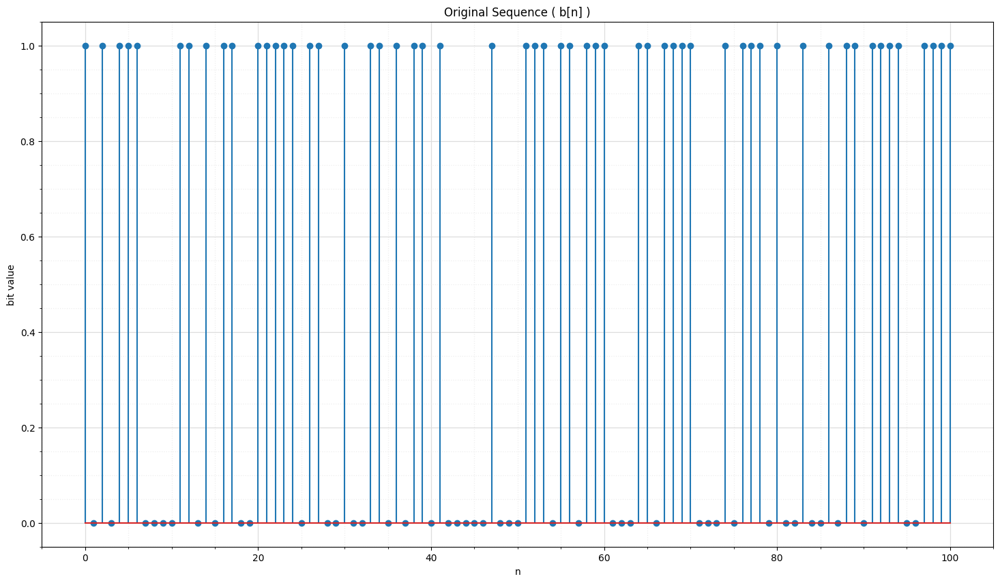

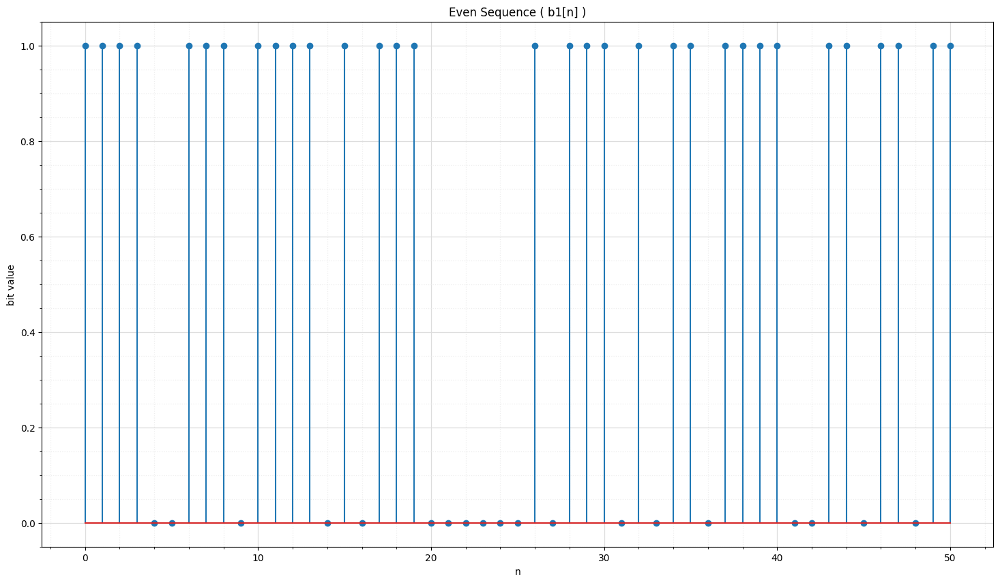

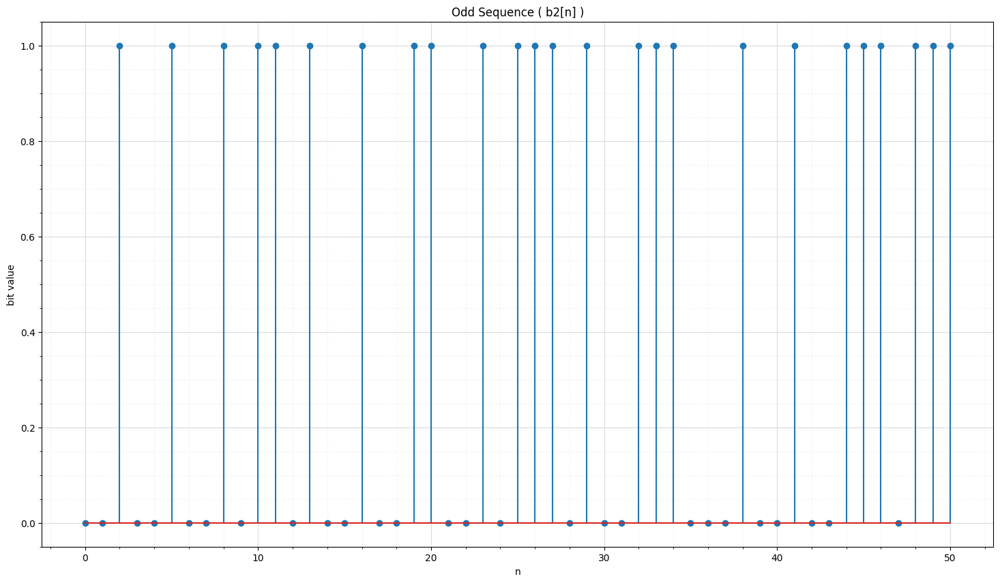

D:\_University_s5\_FULLy\Communication_Systems\Project\Project\venv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


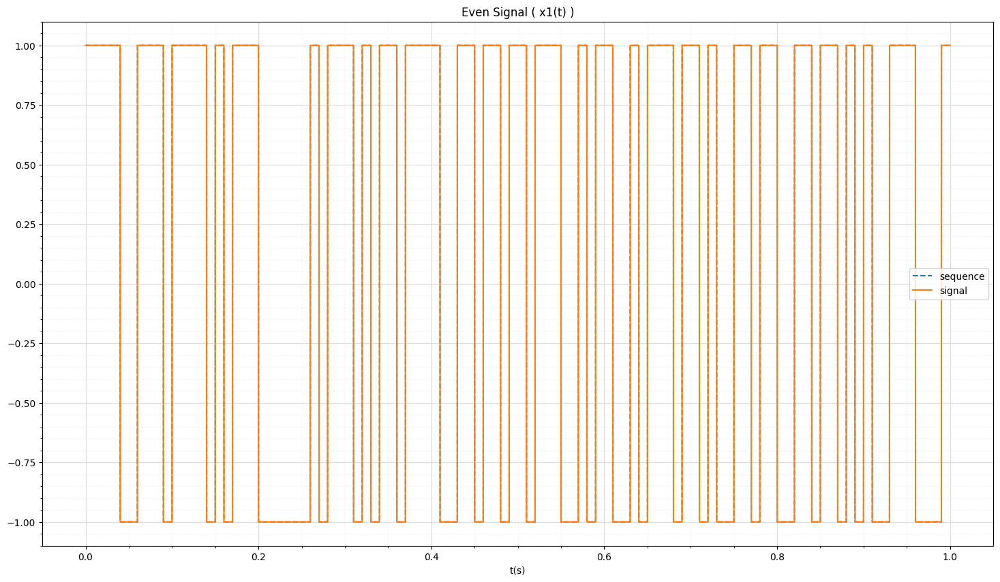

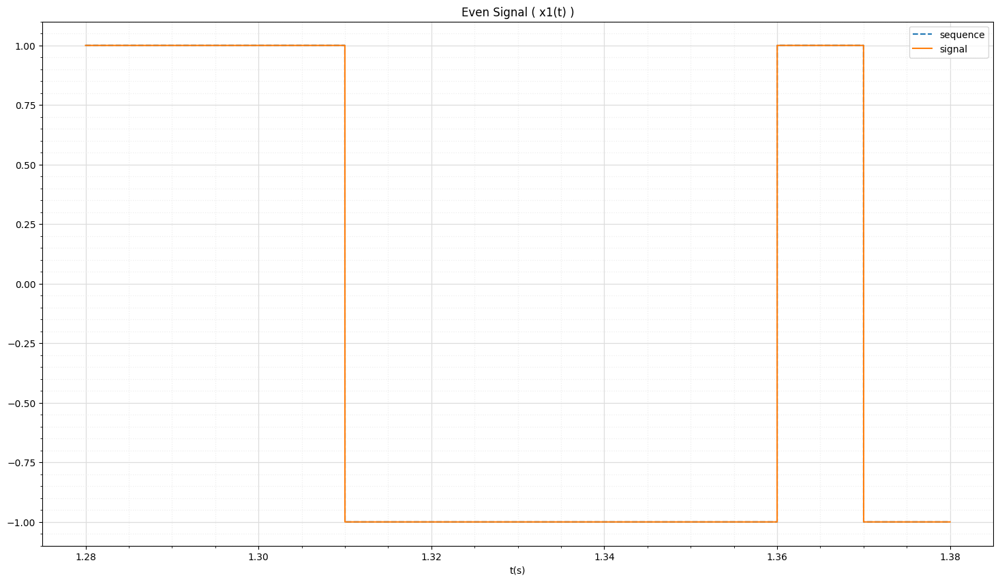

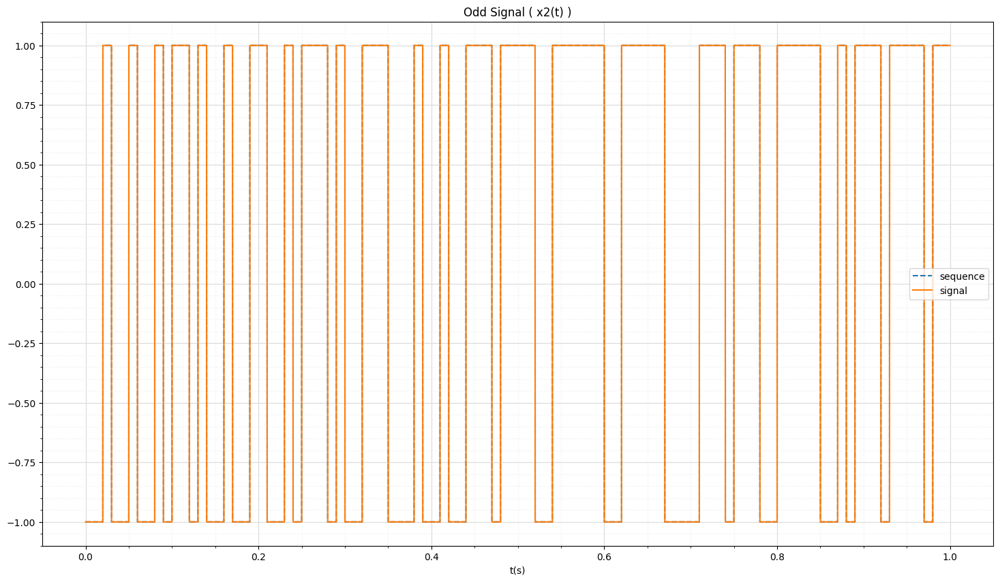

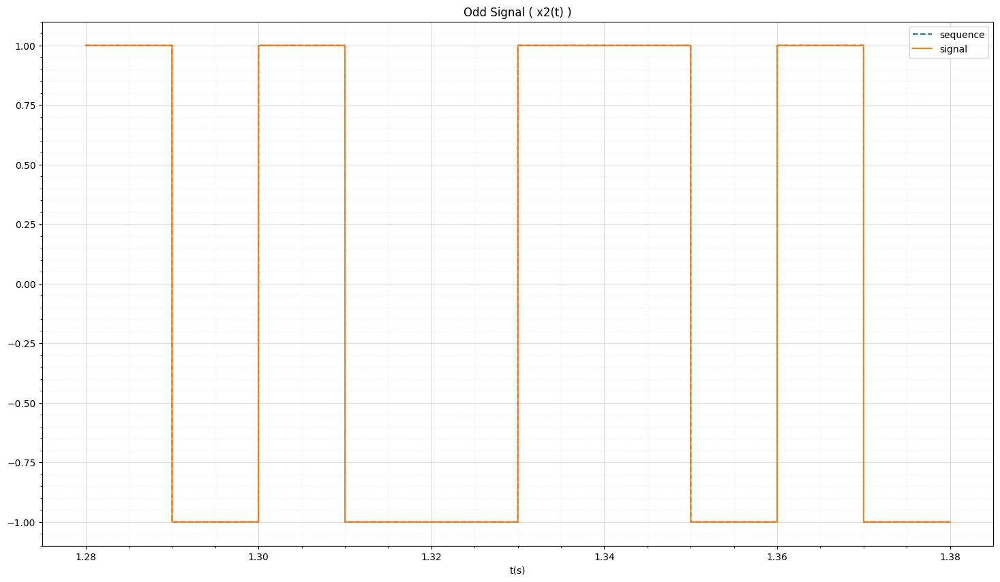

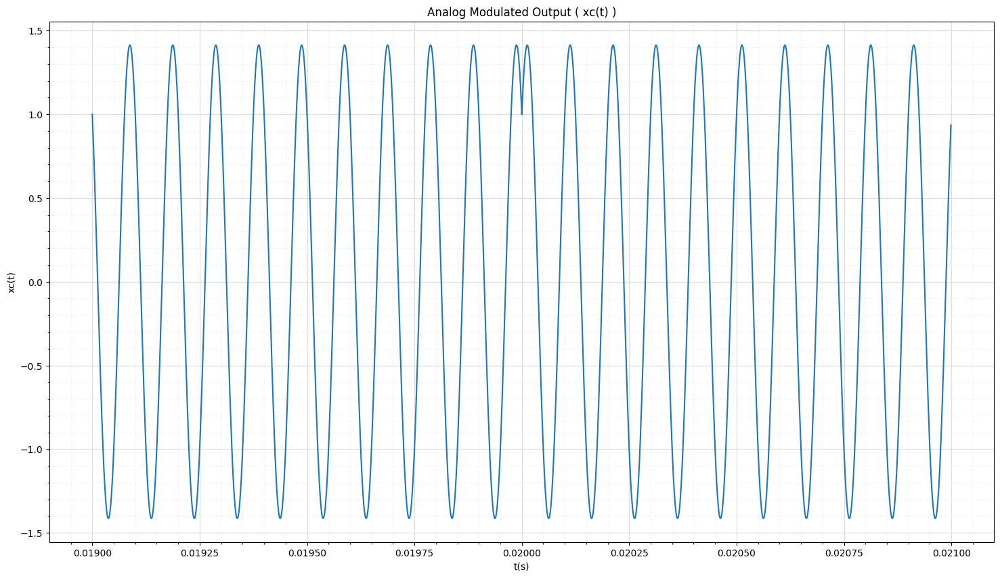

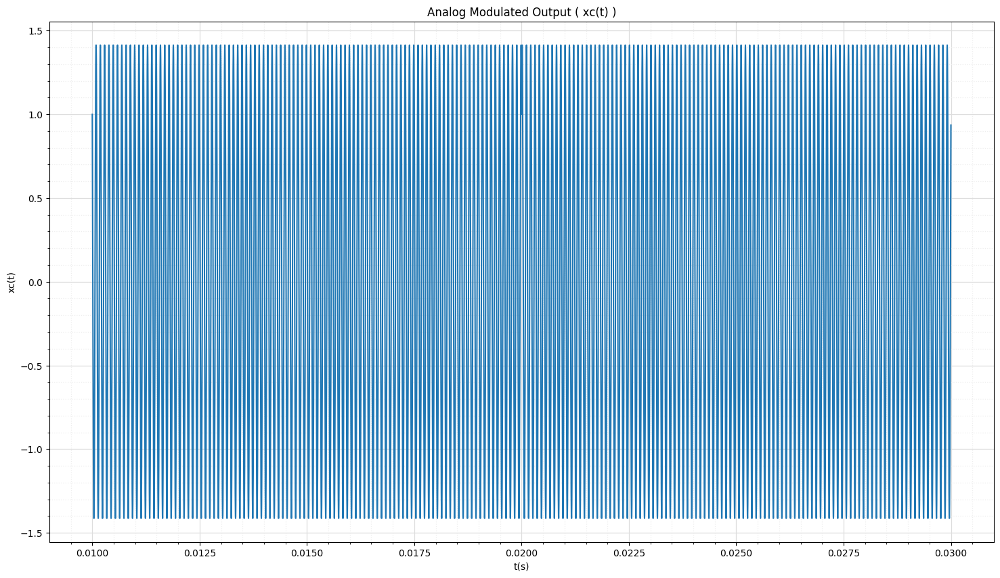

In [69]:
plt.figure(figsize=(18,10))
plt.stem(range(0,101),original_seq[0:101])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Original Sequence ( b[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.stem(range(0,51),even_sequence[0:51])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Sequence ( b1[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.stem(range(0,51),odd_sequence[0:51])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Sequence ( b2[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[0:1000000], even_signal[0:1000000] , label='sequence', linestyle='--')
plt.plot(time[0:1000000], x1[0:1000000], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Signal ( x1(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[start_disp*N0:end_disp*N0], even_signal[start_disp*N0:end_disp*N0] , label='sequence', linestyle='--')
plt.plot(time[start_disp*N0:end_disp*N0], x1[start_disp*N0:end_disp*N0], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Signal ( x1(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[0:1000000], odd_signal[0:1000000] , label='sequence', linestyle='--')
plt.plot(time[0:1000000], x2[0:1000000], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Signal ( x2(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[start_disp*N0:end_disp*N0], odd_signal[start_disp*N0:end_disp*N0] , label='sequence', linestyle='--')
plt.plot(time[start_disp*N0:end_disp*N0], x2[start_disp*N0:end_disp*N0], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Signal ( x2(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[int(1*N0+9*N0/10):int(3*N0-9*N0/10)], xc[int(1*N0+9*N0/10):int(3*N0-9*N0/10)])
plt.xlabel('t(s)')
plt.ylabel('xc(t)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Analog Modulated Output ( xc(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[int(1*N0):int(3*N0)], xc[int(1*N0):int(3*N0)])
plt.xlabel('t(s)')
plt.ylabel('xc(t)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Analog Modulated Output ( xc(t) )")
plt.show()

### <font color='Orange'> 3.1.b </font>:


In [ ]:
xcc = Channel(xc,fs,f_center,Bw)

# Define the parameters
mean = 0
std_dev = np.linspace(0,10,20)
num_samples = len(xcc)

error_prob_array = np.zeros(len(std_dev))

# Generate the Gaussian noise signal
for i in range(len(std_dev)):
    print(i)
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    #print(std_dev[i])
    #print(error_prob(original_seq, predicted_sequence))
    #print(np.sum(original_seq-predicted_sequence))
    error_prob_array[i] = error_prob(original_seq, predicted_sequence)


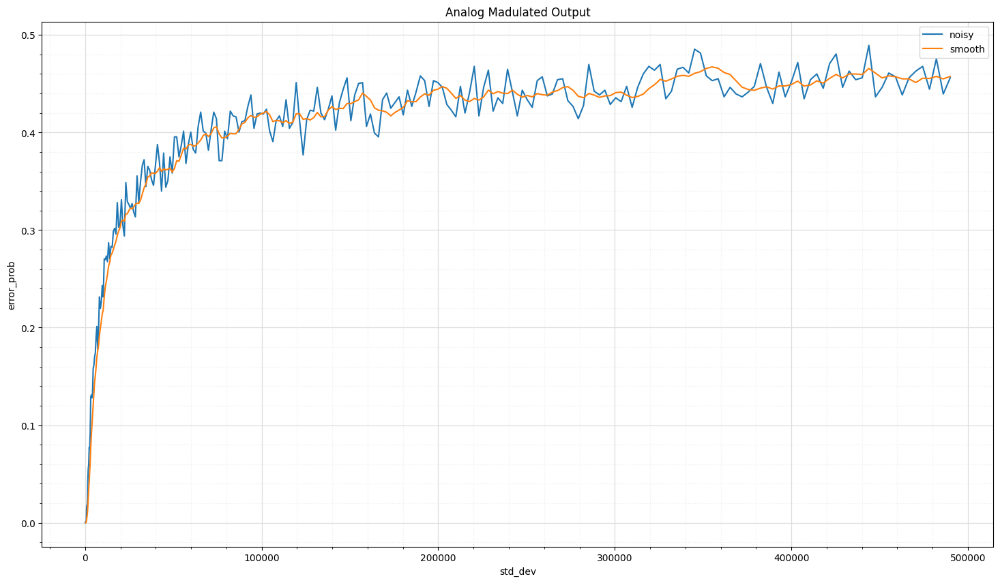

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
# Plot the Raw Data
ts = error_prob_array
smooth_data = pd.Series(ts).rolling(window=7).mean()

plt.figure(figsize=(18,10))
plt.plot(std_dev**2, error_prob_array, label='noisy')
plt.plot(std_dev**2, smooth_data, label='smooth')
plt.legend()
plt.xlabel('Variance')
plt.ylabel('error_prob')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Probability Of Error Vs Variance of noise")
plt.show()

### <font color='Orange'> 3.1.c </font>:


In [128]:
xcc = Channel(xc,fs,f_center,Bw)

# Define the parameters
mean = 0
std_dev = [0,1,5,10,20,30]
num_samples = len(xcc)

b1_hat = np.zeros([len(std_dev),len(even_sequence)])
b2_hat = np.zeros([len(std_dev),len(even_sequence)])
pulse_0 = np.array(pulse_0)
pulse_1 = np.array(pulse_1)

error_prob_array = 0
# Generate the Gaussian noise signal
for i in range(len(std_dev)):
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,2*Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    #print(std_dev[i])
    #print(error_prob(original_seq, predicted_sequence))
    #print(np.sum(original_seq-predicted_sequence))
    Energy_pulse0 = np.sum(pulse_0 * pulse_0)/2
    for q in range(len(predicted_even_sequence)):
        b1_hat[i,q] = output_pulse1_even[N0 * (q+1)]/Energy_pulse0
        b2_hat[i,q] = output_pulse1_odd[N0 * (q+1)]/Energy_pulse0

C:\Users\Home\AppData\Local\Temp\ipykernel_16876\79957652.py:31: ComplexWarning: Casting complex values to real discards the imaginary part
  b1_hat[i,q] = output_pulse1_even[N0 * (q+1)]/Energy_pulse0
C:\Users\Home\AppData\Local\Temp\ipykernel_16876\79957652.py:32: ComplexWarning: Casting complex values to real discards the imaginary part
  b2_hat[i,q] = output_pulse1_odd[N0 * (q+1)]/Energy_pulse0


Text(0.5, 1.0, 'Variance=900.00')

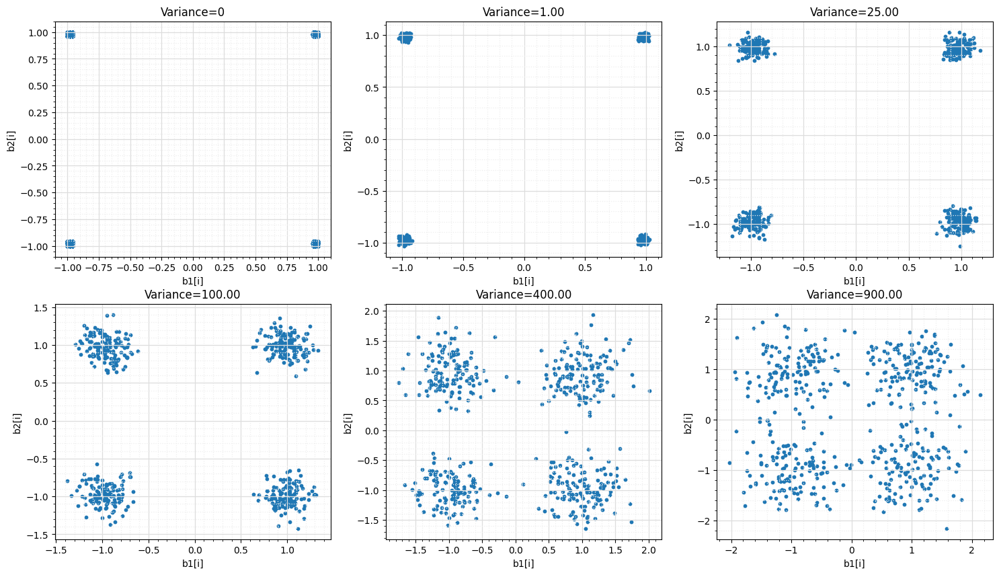

In [129]:
plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.scatter(b1_hat[0,:],b2_hat[0,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={}".format(std_dev[0]**2),)

plt.subplot(2,3,2)
plt.scatter(b1_hat[1,:],b2_hat[1,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[1]**2))

plt.subplot(2,3,3)
plt.scatter(b1_hat[2,:],b2_hat[2,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[2]**2))

plt.subplot(2,3,4)
plt.scatter(b1_hat[3,:],b2_hat[3,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[3]**2))

plt.subplot(2,3,5)
plt.scatter(b1_hat[4,:],b2_hat[4,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[4]**2))

plt.subplot(2,3,6)
plt.scatter(b1_hat[5,:],b2_hat[5,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[5]**2))

## <font color='Green'> 3.2 </font>:


### <font color='Orange'> 3.2.a </font>:

In [12]:
l_seq = 1024
prob = 0.5

start_disp = int(l_seq/4-l_seq/8)
end_disp = start_disp+10

original_seq = np.random.choice([0, 1], size=l_seq, p=[1 - prob, prob])
even_sequence, odd_sequence = Divide(original_seq)

# combine_res = Combine(even_sequence, odd_sequence)

N0 = int(T*fs)
t = np.linspace(0,T,N0)
pulse_1 = np.sin(2*np.pi*t)

pulse_1 = [1] * N0
pulse_1 = pulse_1 * np.sin(2*np.pi*500*t)
pulse_0 = [-1] * N0
pulse_0 = pulse_0 * np.sin(2*np.pi*500*t)

x1 = PulseShaping(even_sequence, pulse_0, pulse_1)
x2 = PulseShaping(odd_sequence, pulse_0, pulse_1)

time = np.linspace(0,len(even_sequence)*T,len(even_sequence)*N0, endpoint=False)

even_signal = []
odd_signal = []

for i in range(len(even_sequence)):
    even_signal.extend([2*even_sequence[i]-1] * N0)
    odd_signal.extend([2*odd_sequence[i]-1] * N0)

xc = AnalogMod(x1,x2,fs,fc)

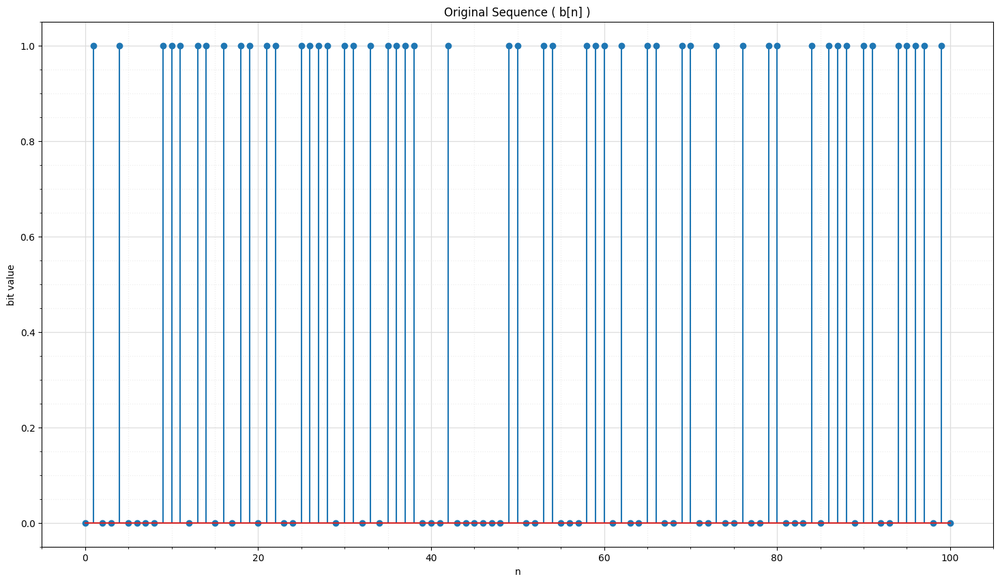

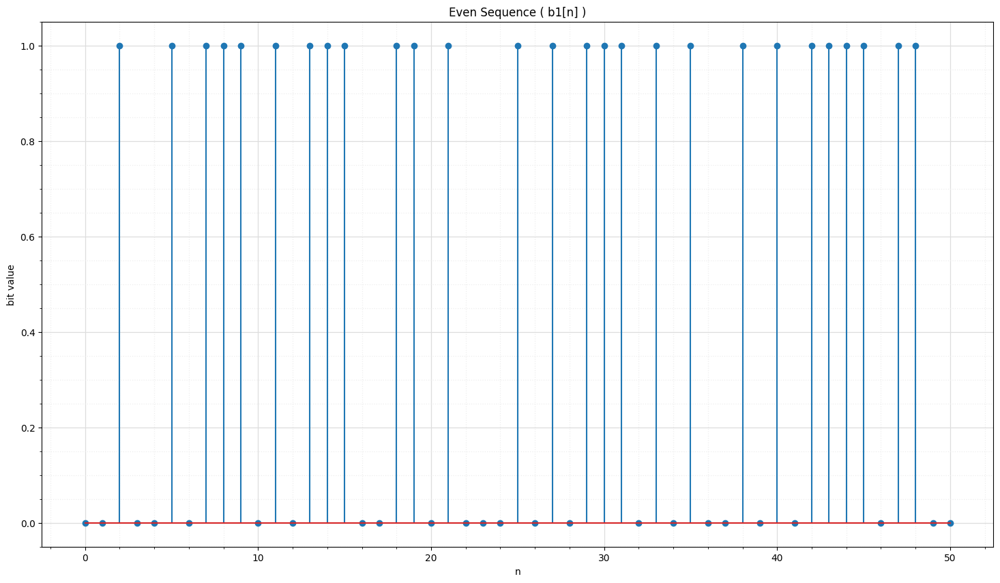

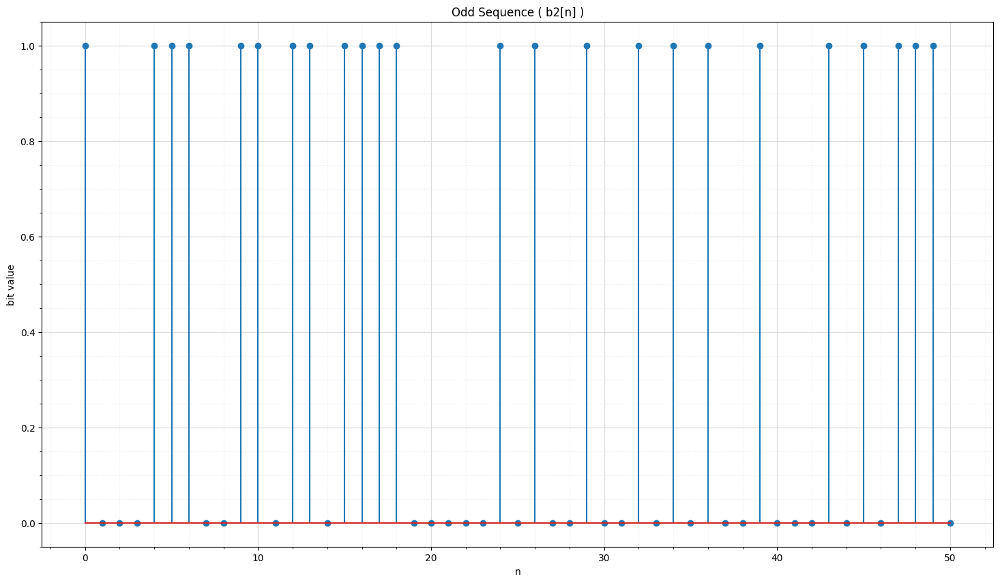

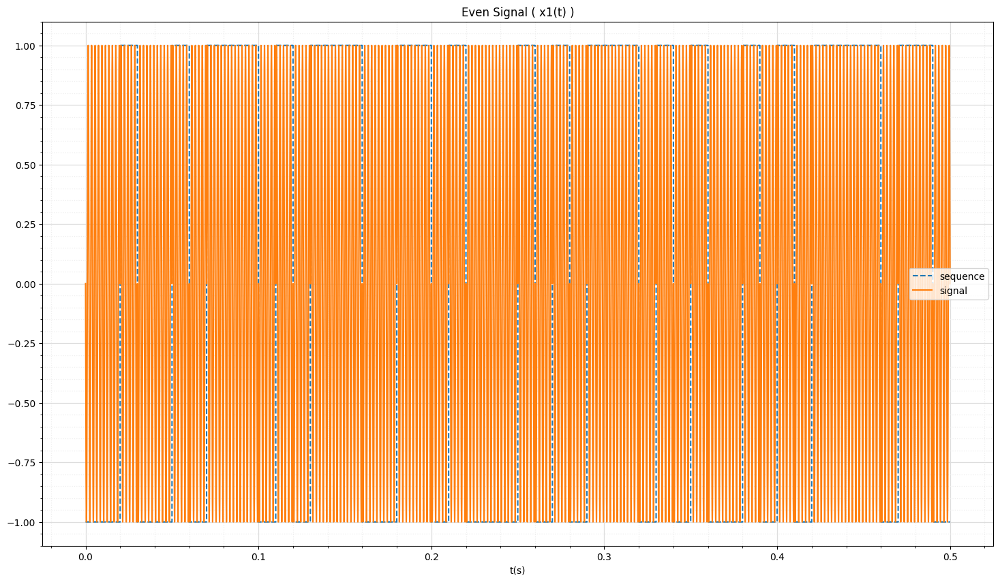

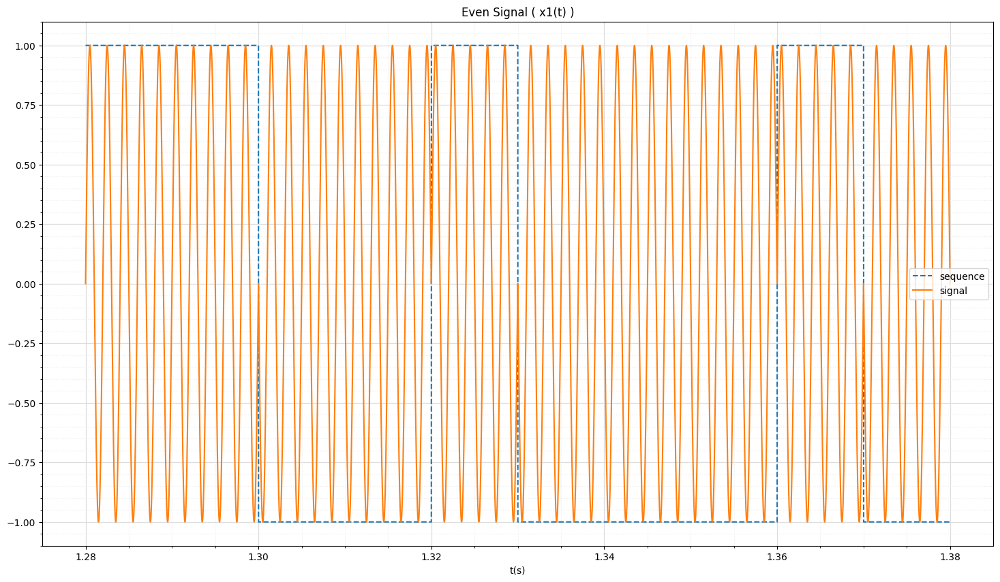

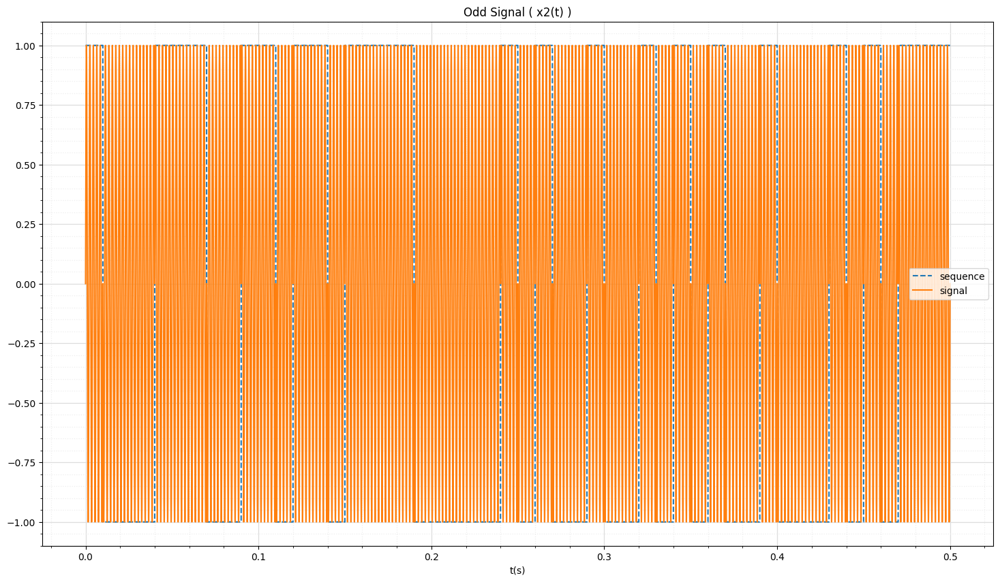

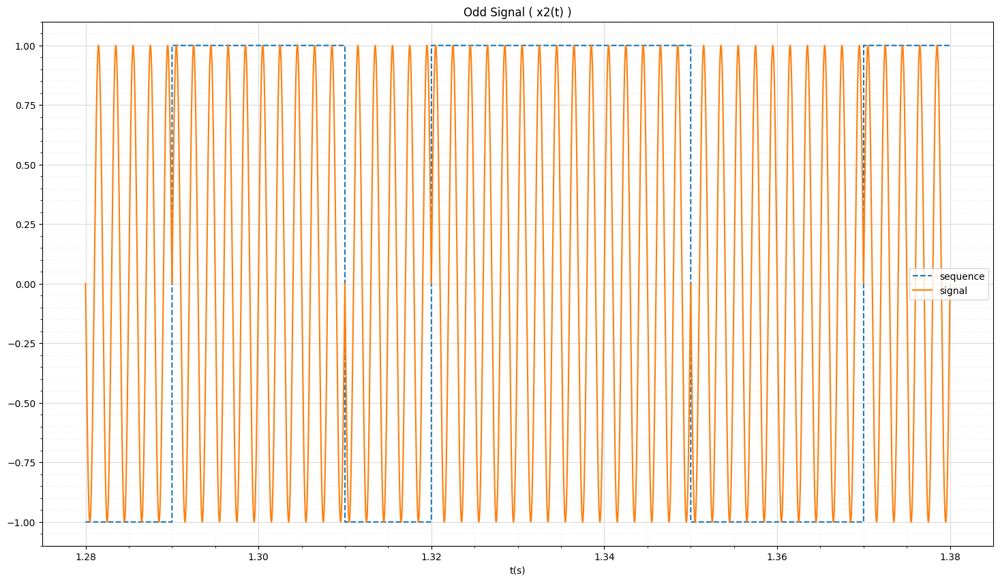

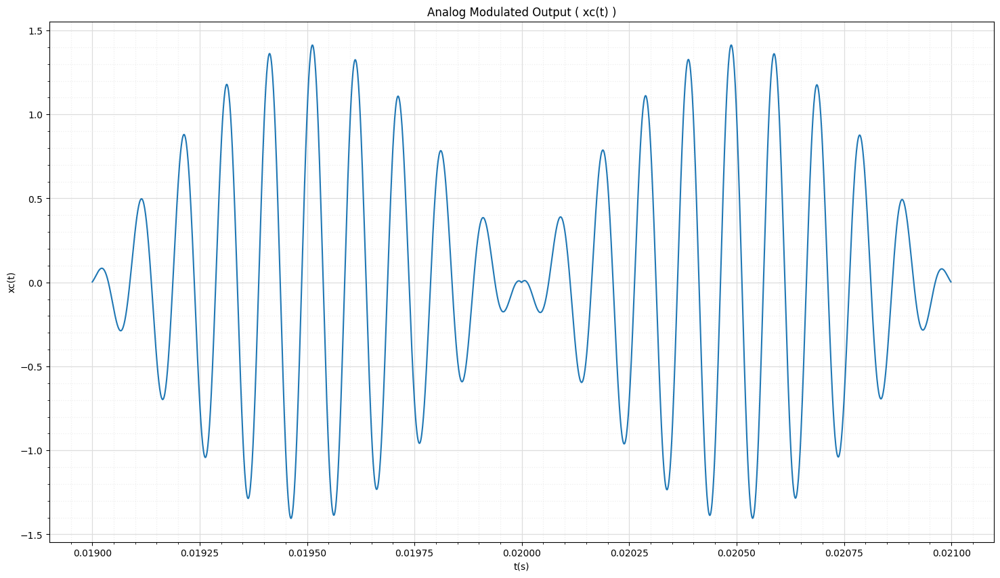

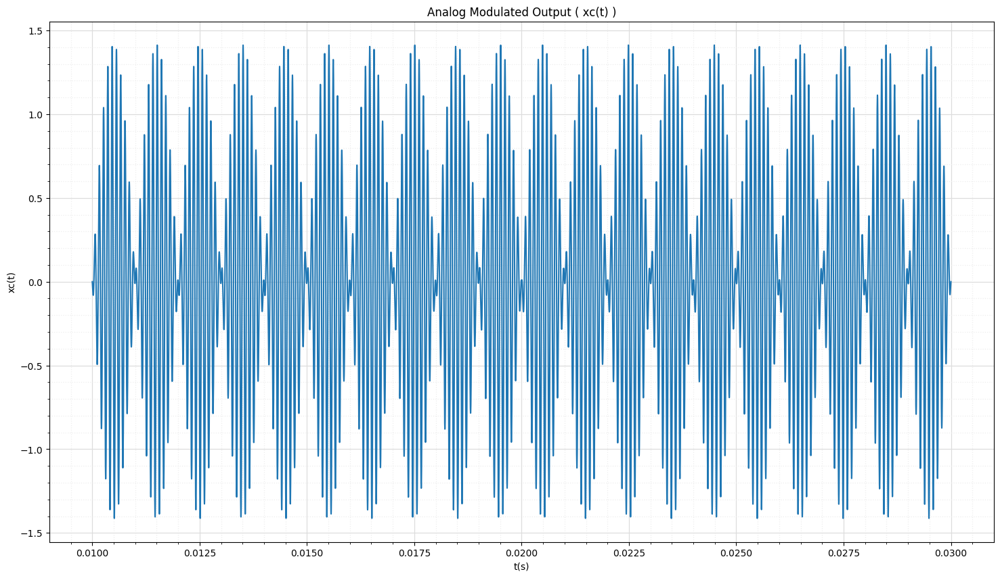

In [132]:
plt.figure(figsize=(18,10))
plt.stem(range(0,101),original_seq[0:101])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Original Sequence ( b[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.stem(range(0,51),even_sequence[0:51])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Sequence ( b1[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.stem(range(0,51),odd_sequence[0:51])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Sequence ( b2[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[0:500000], even_signal[0:500000] , label='sequence', linestyle='--')
plt.plot(time[0:500000], x1[0:500000], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Signal ( x1(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[start_disp*N0:end_disp*N0], even_signal[start_disp*N0:end_disp*N0] , label='sequence', linestyle='--')
plt.plot(time[start_disp*N0:end_disp*N0], x1[start_disp*N0:end_disp*N0], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Signal ( x1(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[0:500000], odd_signal[0:500000] , label='sequence', linestyle='--')
plt.plot(time[0:500000], x2[0:500000], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Signal ( x2(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[start_disp*N0:end_disp*N0], odd_signal[start_disp*N0:end_disp*N0] , label='sequence', linestyle='--')
plt.plot(time[start_disp*N0:end_disp*N0], x2[start_disp*N0:end_disp*N0], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Signal ( x2(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[int(1*N0+9*N0/10):int(3*N0-9*N0/10)], xc[int(1*N0+9*N0/10):int(3*N0-9*N0/10)])
plt.xlabel('t(s)')
plt.ylabel('xc(t)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Analog Modulated Output ( xc(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[int(1*N0):int(3*N0)], xc[int(1*N0):int(3*N0)])
plt.xlabel('t(s)')
plt.ylabel('xc(t)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Analog Modulated Output ( xc(t) )")
plt.show()

### <font color='Orange'> 3.2.b </font>:


In [ ]:
xcc = Channel(xc,fs,f_center,Bw)

# Define the parameters
mean = 0
std_dev = np.linspace(0,700,250)
num_samples = len(xcc)

error_prob_array = np.zeros(len(std_dev))

# Generate the Gaussian noise signal
for i in range(len(std_dev)):
    print(i)
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    #print(std_dev[i])
    #print(error_prob(original_seq, predicted_sequence))
    #print(np.sum(original_seq-predicted_sequence))
    error_prob_array[i] = error_prob(original_seq, predicted_sequence)

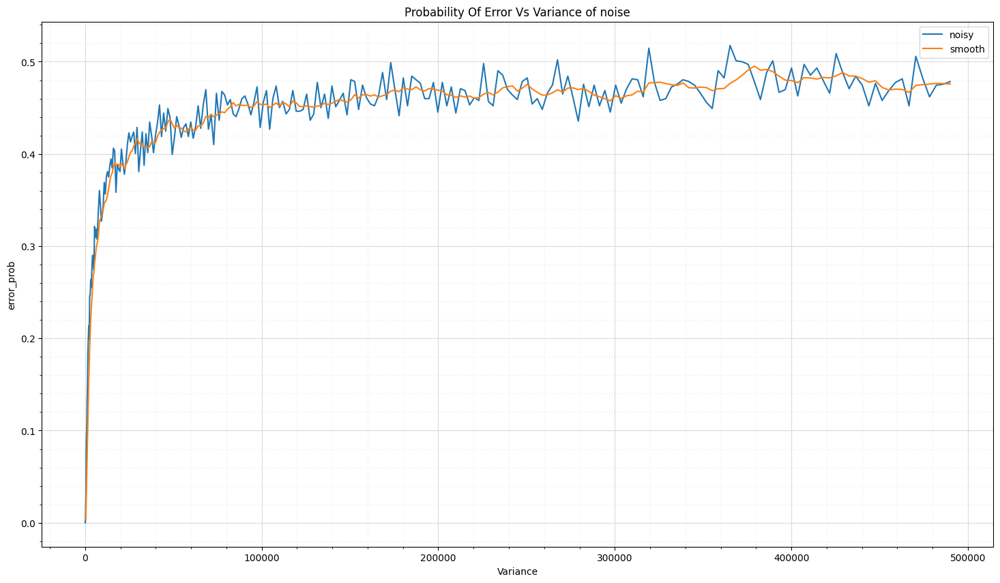

In [138]:
import pandas as pd
import matplotlib.pyplot as plt
# Plot the Raw Data
ts = error_prob_array
smooth_data = pd.Series(ts).rolling(window=7).mean()

plt.figure(figsize=(18,10))
plt.plot(std_dev**2, error_prob_array, label='noisy')
plt.plot(std_dev**2, smooth_data, label='smooth')
plt.legend()
plt.xlabel('Variance')
plt.ylabel('error_prob')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Probability Of Error Vs Variance of noise")
plt.show()

### <font color='Orange'> 3.2.c </font>:


In [16]:
xcc = Channel(xc,fs,f_center,Bw)

# Define the parameters
mean = 0
std_dev = [0,1,5,10,20,30]
num_samples = len(xcc)

b1_hat = np.zeros([len(std_dev),len(even_sequence)])
b2_hat = np.zeros([len(std_dev),len(even_sequence)])
pulse_0 = np.array(pulse_0)
pulse_1 = np.array(pulse_1)

error_prob_array = 0
# Generate the Gaussian noise signal
for i in range(len(std_dev)):
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,2*Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    #print(std_dev[i])
    #print(error_prob(original_seq, predicted_sequence))
    #print(np.sum(original_seq-predicted_sequence))
    Energy_pulse0 = np.sum(pulse_0 * pulse_0)/4
    for q in range(len(predicted_even_sequence)):
        b1_hat[i,q] = output_pulse1_even[N0 * (q+1)]/Energy_pulse0
        b2_hat[i,q] = output_pulse1_odd[N0 * (q+1)]/Energy_pulse0

C:\Users\Home\AppData\Local\Temp\ipykernel_13004\336155021.py:31: ComplexWarning: Casting complex values to real discards the imaginary part
  b1_hat[i,q] = output_pulse1_even[N0 * (q+1)]/Energy_pulse0
C:\Users\Home\AppData\Local\Temp\ipykernel_13004\336155021.py:32: ComplexWarning: Casting complex values to real discards the imaginary part
  b2_hat[i,q] = output_pulse1_odd[N0 * (q+1)]/Energy_pulse0


Text(0.5, 1.0, 'Variance=900.00')

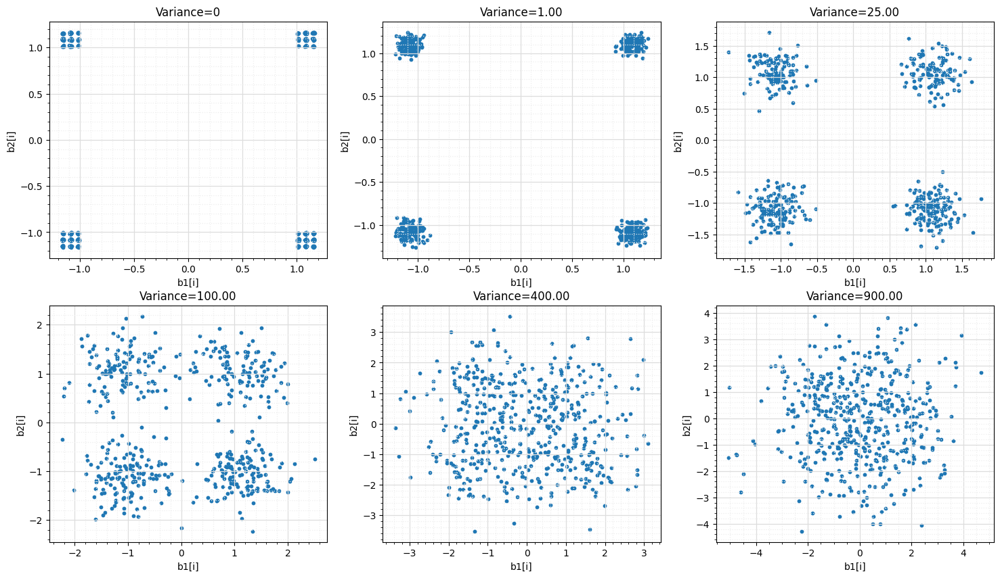

In [17]:
plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.scatter(b1_hat[0,:],b2_hat[0,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={}".format(std_dev[0]**2),)

plt.subplot(2,3,2)
plt.scatter(b1_hat[1,:],b2_hat[1,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[1]**2))

plt.subplot(2,3,3)
plt.scatter(b1_hat[2,:],b2_hat[2,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[2]**2))

plt.subplot(2,3,4)
plt.scatter(b1_hat[3,:],b2_hat[3,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[3]**2))

plt.subplot(2,3,5)
plt.scatter(b1_hat[4,:],b2_hat[4,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[4]**2))

plt.subplot(2,3,6)
plt.scatter(b1_hat[5,:],b2_hat[5,:],s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[5]**2))

## <font color='Green'> 3.3 </font>:

### <font color='Orange'> 3.3.b </font>:

In [50]:
l_seq = 1024
prob = 0.5

start_disp = int(l_seq/4-l_seq/8)
end_disp = start_disp+4

original_seq = np.random.choice([0, 1], size=l_seq, p=[1 - prob, prob])
even_sequence, odd_sequence = Divide(original_seq)

# combine_res = Combine(even_sequence, odd_sequence)

N0 = int(T*fs)
t = np.linspace(0,T,N0)

pulse_1 = [1] * N0
pulse_1 = pulse_1 * np.sin(2*np.pi*100*t)
pulse_0 = [1] * N0
pulse_0 = pulse_0 * np.sin(2*np.pi*150*t)

x1 = PulseShaping(even_sequence, pulse_0, pulse_1)
x2 = PulseShaping(odd_sequence, pulse_0, pulse_1)

time = np.linspace(0,len(even_sequence)*T,len(even_sequence)*N0, endpoint=False)

even_signal = []
odd_signal = []

for i in range(len(even_sequence)):
    even_signal.extend([2*even_sequence[i]-1] * N0)
    odd_signal.extend([2*odd_sequence[i]-1] * N0)

xc = AnalogMod(x1,x2,fs,fc)

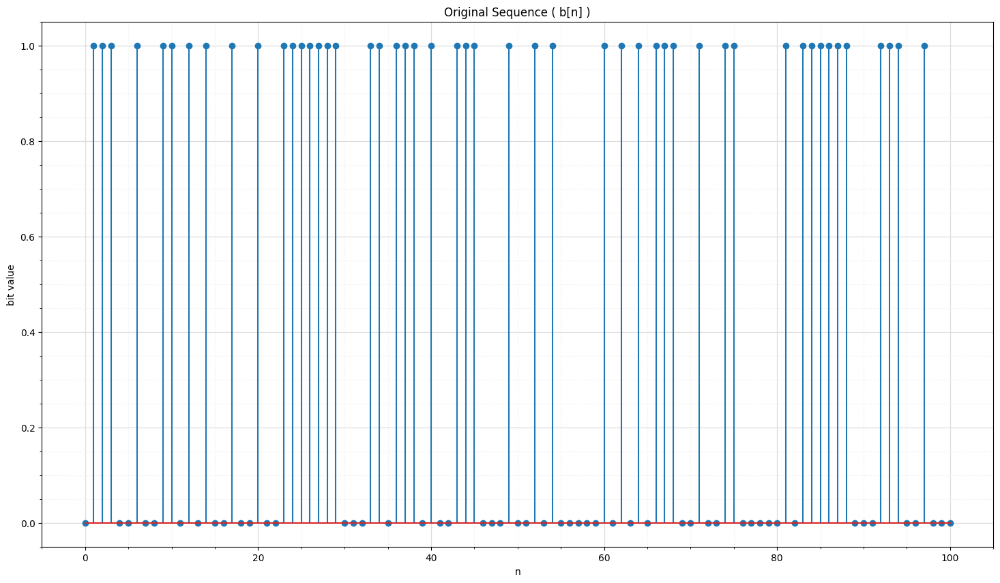

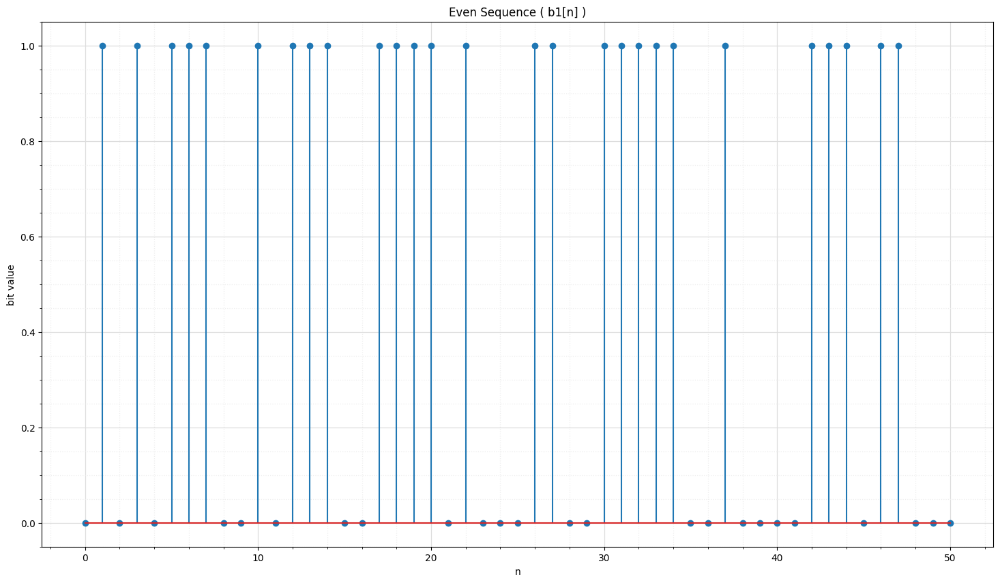

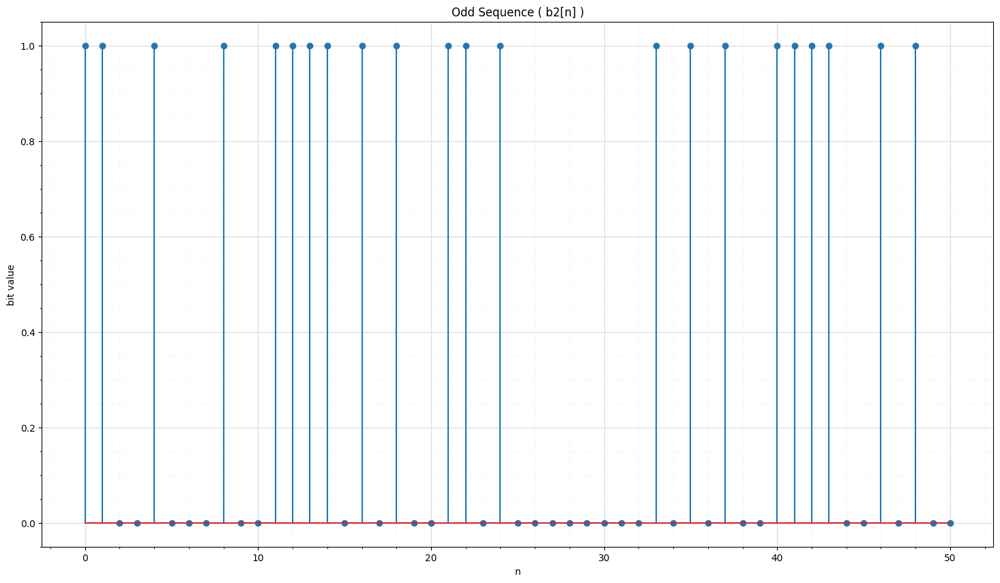

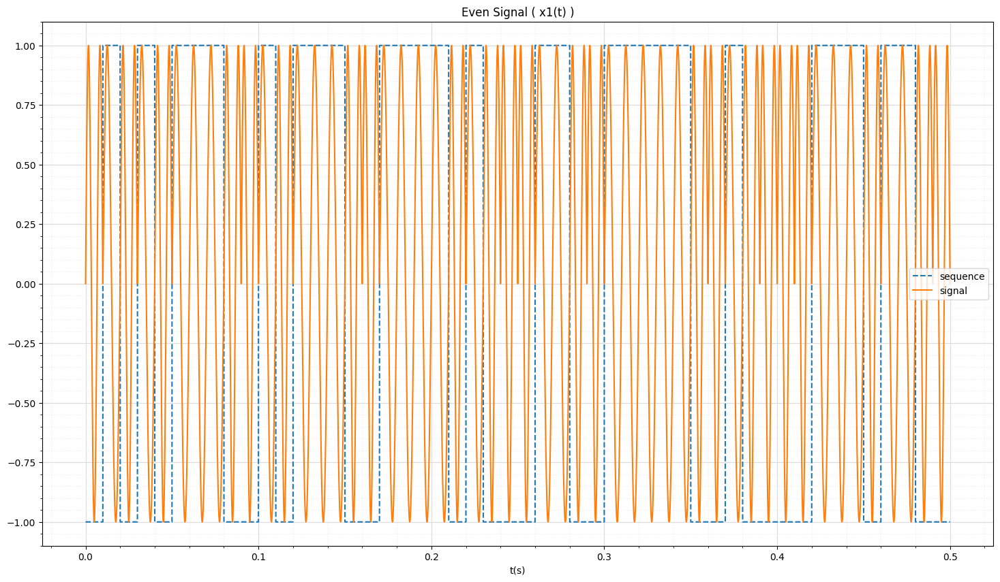

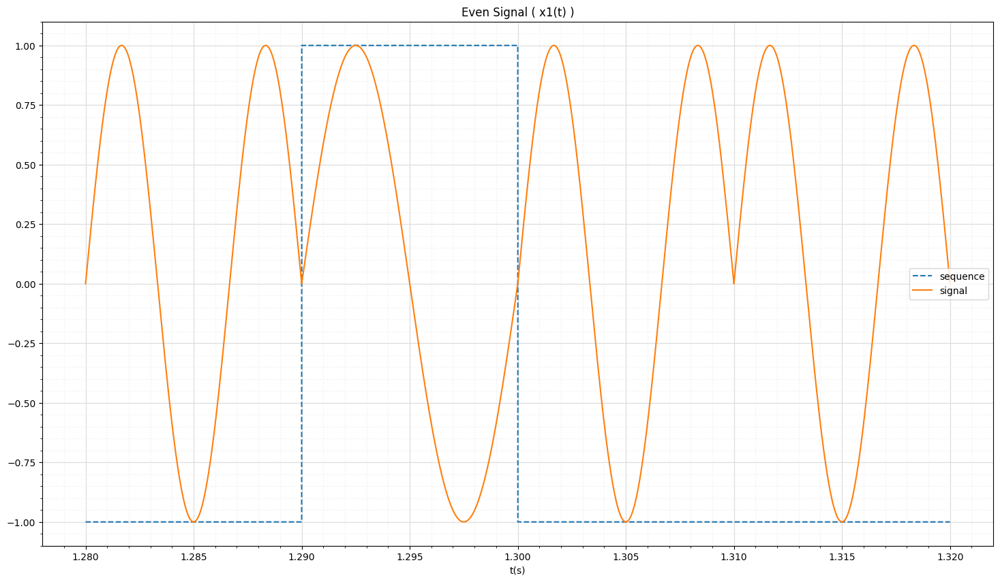

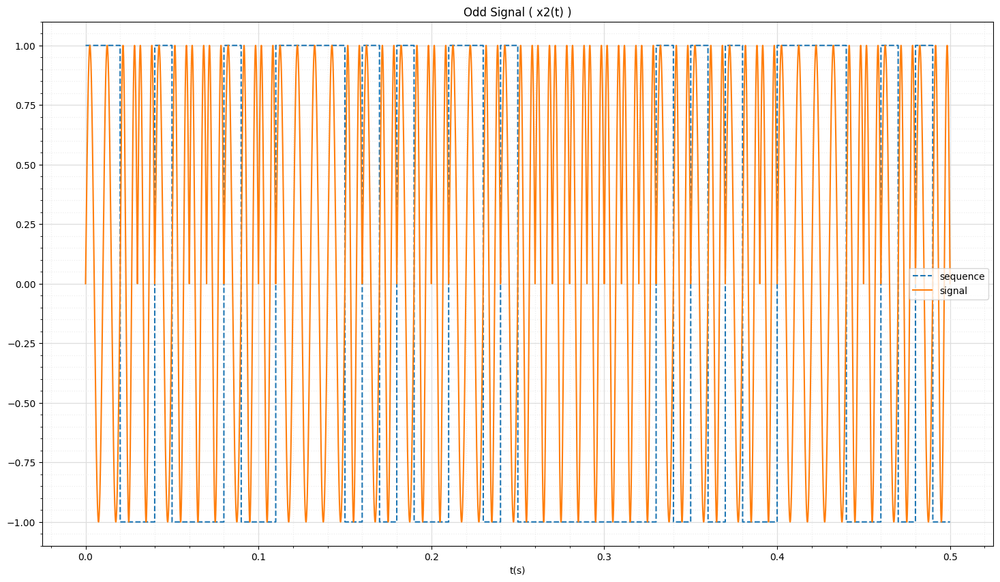

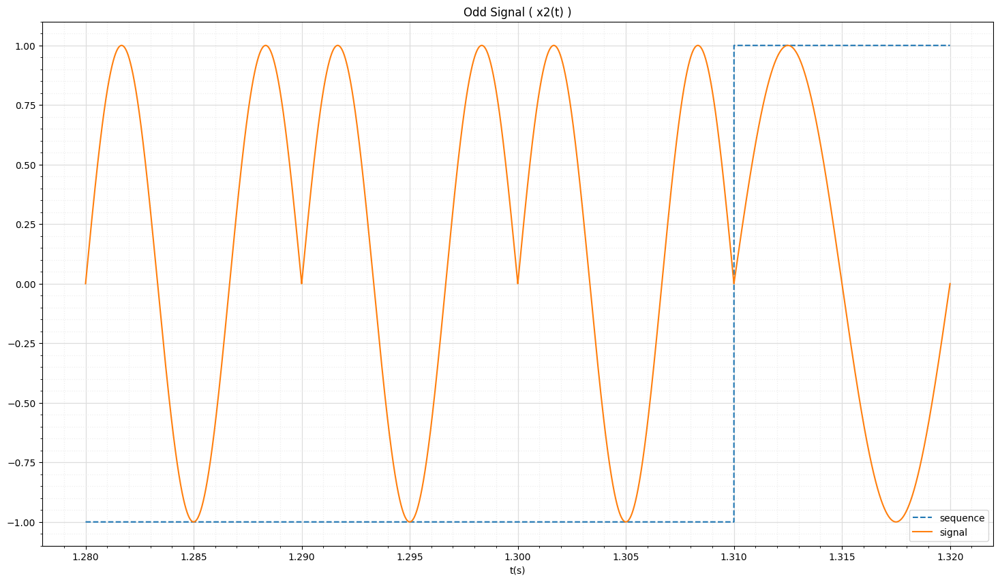

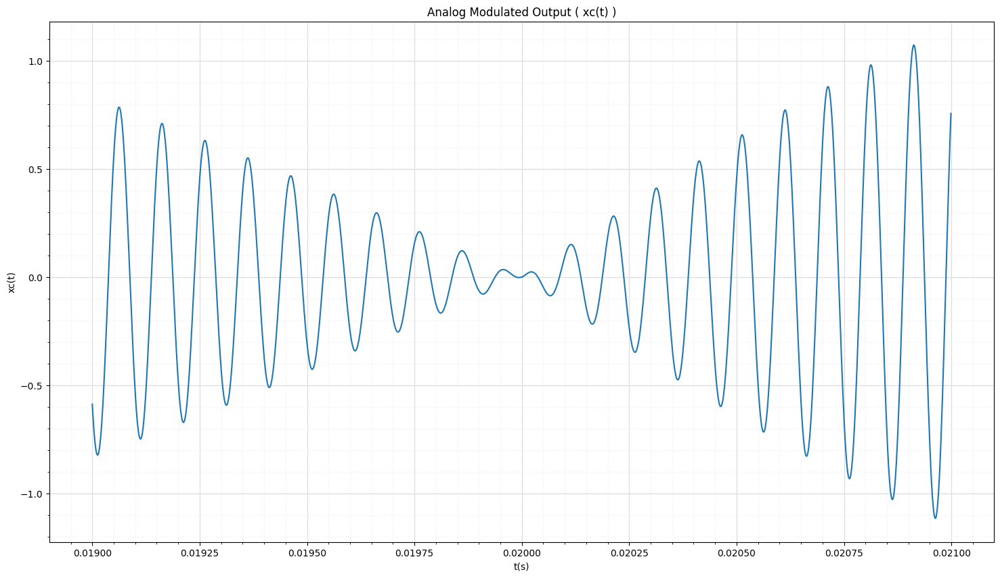

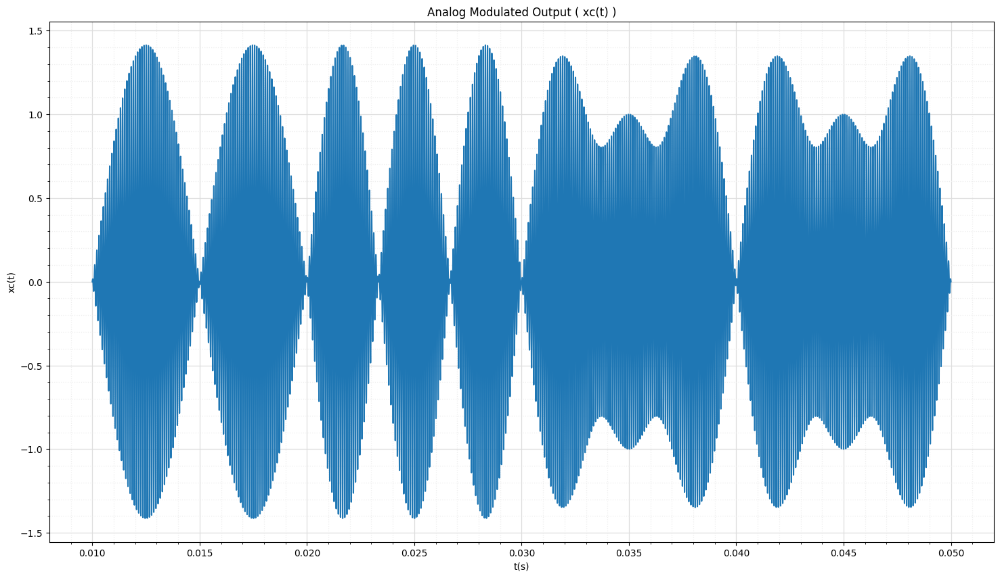

In [26]:
plt.figure(figsize=(18,10))
plt.stem(range(0,101),original_seq[0:101])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Original Sequence ( b[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.stem(range(0,51),even_sequence[0:51])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Sequence ( b1[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.stem(range(0,51),odd_sequence[0:51])
plt.xlabel('n')
plt.ylabel('bit value')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Sequence ( b2[n] )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[0:500000], even_signal[0:500000] , label='sequence', linestyle='--')
plt.plot(time[0:500000], x1[0:500000], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Signal ( x1(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[start_disp*N0:end_disp*N0], even_signal[start_disp*N0:end_disp*N0] , label='sequence', linestyle='--')
plt.plot(time[start_disp*N0:end_disp*N0], x1[start_disp*N0:end_disp*N0], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Even Signal ( x1(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[0:500000], odd_signal[0:500000] , label='sequence', linestyle='--')
plt.plot(time[0:500000], x2[0:500000], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Signal ( x2(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[start_disp*N0:end_disp*N0], odd_signal[start_disp*N0:end_disp*N0] , label='sequence', linestyle='--')
plt.plot(time[start_disp*N0:end_disp*N0], x2[start_disp*N0:end_disp*N0], label='signal')
plt.legend()
plt.xlabel('t(s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Odd Signal ( x2(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[int(1*N0+9*N0/10):int(3*N0-9*N0/10)], xc[int(1*N0+9*N0/10):int(3*N0-9*N0/10)])
plt.xlabel('t(s)')
plt.ylabel('xc(t)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Analog Modulated Output ( xc(t) )")
plt.show()

plt.figure(figsize=(18,10))
plt.plot(time[int(1*N0):int(5*N0)], xc[int(1*N0):int(5*N0)])
plt.xlabel('t(s)')
plt.ylabel('xc(t)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Analog Modulated Output ( xc(t) )")
plt.show()

### <font color='Orange'> 3.3.c </font>:

In [ ]:
xcc = Channel(xc,fs,f_center,Bw)

# Define the parameters
mean = 0
std_dev = np.linspace(0,700,250)
num_samples = len(xcc)

error_prob_array = np.zeros(len(std_dev))

# Generate the Gaussian noise signal
for i in range(len(std_dev)):
    print(i)
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(2*y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(2*y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    #print(std_dev[i])
    #print(error_prob(original_seq, predicted_sequence))
    #print(np.sum(original_seq-predicted_sequence))
    error_prob_array[i] = error_prob(original_seq, predicted_sequence)

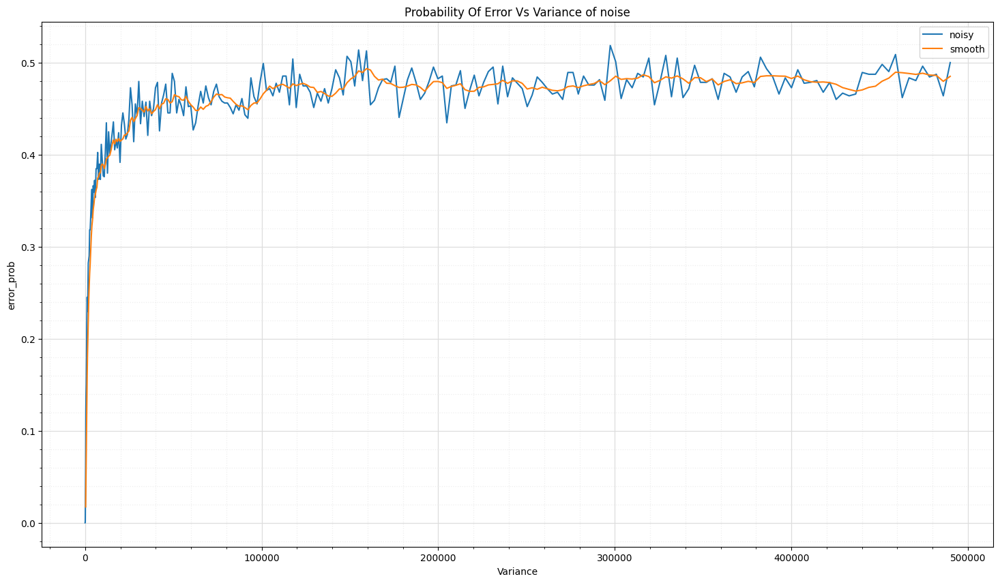

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
# Plot the Raw Data
ts = error_prob_array
smooth_data = pd.Series(ts).rolling(window=7).mean()

plt.figure(figsize=(18,10))
plt.plot(std_dev**2, error_prob_array, label='noisy')
plt.plot(std_dev**2, smooth_data, label='smooth')
plt.legend()
plt.xlabel('Variance')
plt.ylabel('error_prob')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Probability Of Error Vs Variance of noise")
plt.show()

### <font color='Orange'> 3.3.d </font>:


In [58]:
xcc = Channel(xc,fs,f_center,Bw)

# Define the parameters
mean = 0
std_dev = [0,1,5,10,20,30]
num_samples = len(xcc)

b1_hat = np.zeros([len(std_dev),len(even_sequence)])
b2_hat = np.zeros([len(std_dev),len(even_sequence)])
pulse_0 = np.array(pulse_0)
pulse_1 = np.array(pulse_1)

error_prob_array = 0
# Generate the Gaussian noise signal
for i in range(len(std_dev)):
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,2*Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    #print(std_dev[i])
    #print(error_prob(original_seq, predicted_sequence))
    #print(np.sum(original_seq-predicted_sequence))
    Energy_pulse0 = np.sum(pulse_0 * pulse_0)/4
    for q in range(len(predicted_even_sequence)):
        b1_hat[i,q] = output_pulse1_even[N0 * (q+1)]/Energy_pulse0
        b2_hat[i,q] = output_pulse1_odd[N0 * (q+1)]/Energy_pulse0

C:\Users\Home\AppData\Local\Temp\ipykernel_15092\336155021.py:31: ComplexWarning: Casting complex values to real discards the imaginary part
  b1_hat[i,q] = output_pulse1_even[N0 * (q+1)]/Energy_pulse0
C:\Users\Home\AppData\Local\Temp\ipykernel_15092\336155021.py:32: ComplexWarning: Casting complex values to real discards the imaginary part
  b2_hat[i,q] = output_pulse1_odd[N0 * (q+1)]/Energy_pulse0


Text(0.5, 1.0, 'Variance=900.00')

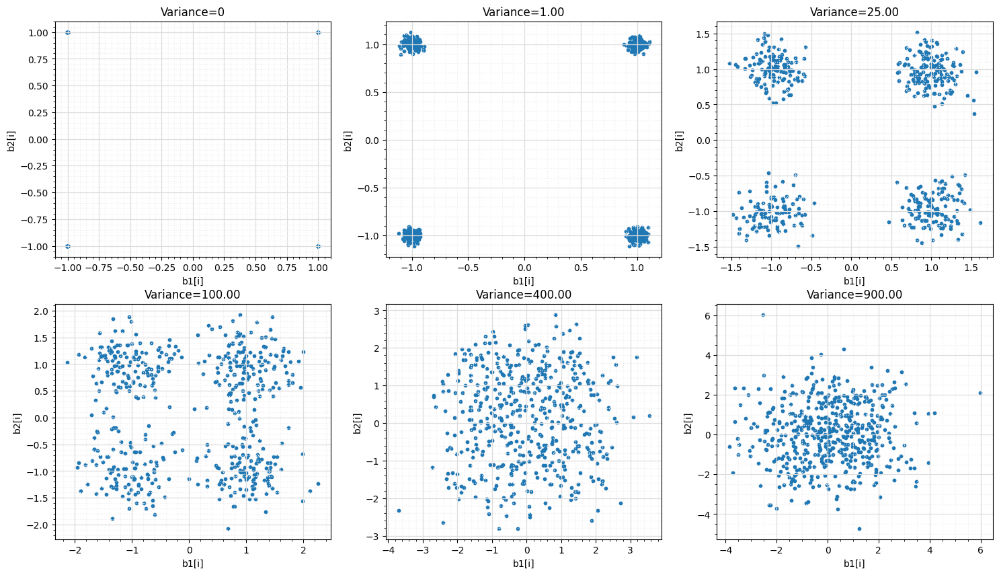

In [60]:
plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.scatter(b1_hat[0,:]-1,b2_hat[0,:]-1,s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={}".format(std_dev[0]**2),)

plt.subplot(2,3,2)
plt.scatter(b1_hat[1,:]-1,b2_hat[1,:]-1,s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[1]**2))

plt.subplot(2,3,3)
plt.scatter(b1_hat[2,:]-1,b2_hat[2,:]-1,s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[2]**2))

plt.subplot(2,3,4)
plt.scatter(b1_hat[3,:]-1,b2_hat[3,:]-1,s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[3]**2))

plt.subplot(2,3,5)
plt.scatter(b1_hat[4,:]-1,b2_hat[4,:]-1,s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[4]**2))

plt.subplot(2,3,6)
plt.scatter(b1_hat[5,:]-1,b2_hat[5,:]-1,s=10)
plt.xlabel('b1[i]')
plt.ylabel('b2[i]')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance={:.2f}".format(std_dev[5]**2))

. <hr> <hr> <hr> <hr>


# <font color='red'>Part4: Transmission of a random sequence of zeros and ones
 </font>


## <font color='Green'> 4.1 </font>:

In [13]:
def SourceGenerator(sequence):
    binary_sequence = np.unpackbits(np.array(sequence, dtype=np.uint8)).reshape(1, -1)[0,:]
    return binary_sequence

In [14]:
def OutputDecoder(sequence):
    n_numbers = int(len(sequence)/8)
    numbers = np.zeros(n_numbers,int)
    for i in range(n_numbers):
        bin_list = sequence[i*8:(i+1)*8]
        bin_str = ''.join(map(str, bin_list))
        int_value = int(bin_str, 2)
        numbers[i] = int_value

    return numbers


**test:**

In [64]:
bin = SourceGenerator([4,51,34,123])
out = OutputDecoder(bin)
print("numbers: ",[4,51,34,123])
print("binary: ",bin)
print("reconstruction: ",out)

numbers:  [4, 51, 34, 123]
binary:  [0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 0 0 1 0 0 1 1 1 1 0 1 1]
reconstruction:  [  4  51  34 123]


## <font color='Green'> 4.2 </font>:


In [15]:
fs = 1000000
T = 0.01
fc = 10000
f_center = 10000
Bw = 1000

In [16]:
l_seq = 512
prob = 0.5

start_disp = int(l_seq/4-l_seq/8)
end_disp = start_disp+10

original_seq_numbers = np.random.choice(np.array(range(0,256)) , size=l_seq)
original_seq = SourceGenerator(original_seq_numbers)

even_sequence, odd_sequence = Divide(original_seq)

# combine_res = Combine(even_sequence, odd_sequence)

N0 = int(T*fs)

pulse_1 = [1] * N0
pulse_0 = [-1] * N0

x1 = PulseShaping(even_sequence, pulse_0, pulse_1)
x2 = PulseShaping(odd_sequence, pulse_0, pulse_1)

time = np.linspace(0,len(even_sequence)*T,len(even_sequence)*N0, endpoint=False)

xc = AnalogMod(x1,x2,fs,fc)

xcc = Channel(xc,fs,f_center,Bw)



In [18]:
# Define the parameters
mean = 0
std_dev = np.linspace(0,100,50)
num_samples = len(xcc)

var_sq_diff_array = np.zeros(len(std_dev))

In [ ]:
for i in range(len(std_dev)):
    print(i)
    gaussian_noise = np.random.normal(mean, std_dev[i], num_samples)

    xr = gaussian_noise + xcc

    y1,y2 = AnalogDemod(xr,fs,fc,Bw)

    output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
    output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

    predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
    predicted_seq_numbers = OutputDecoder(predicted_sequence)
    diff_numbers = -predicted_seq_numbers+original_seq_numbers
    sq_diff_numbers = np.power(diff_numbers, 2)
    var_sq_diff_array[i] = np.var(sq_diff_numbers)

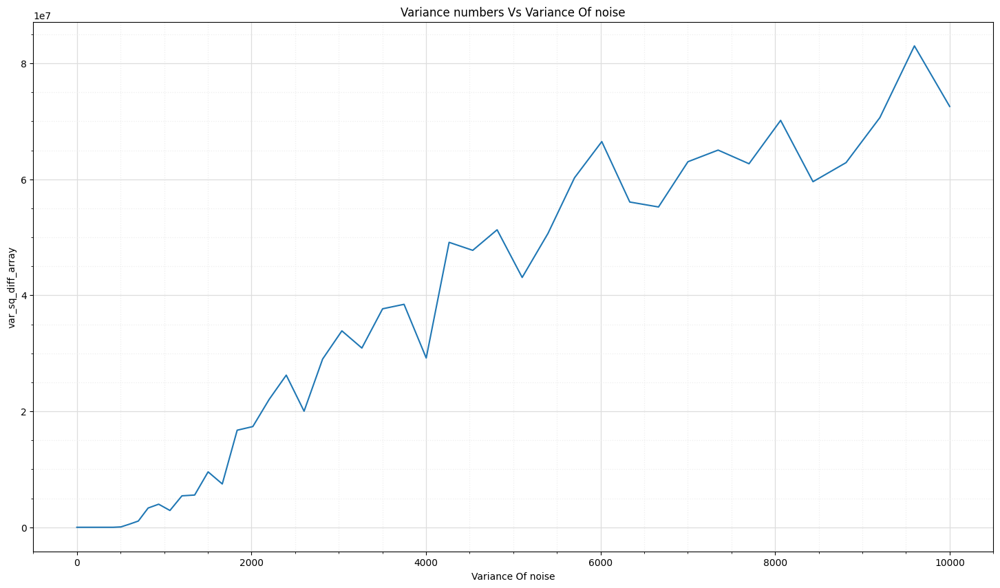

In [100]:
plt.figure(figsize=(18,10))
plt.plot(std_dev**2, var_sq_diff_array)
plt.xlabel('Variance Of noise')
plt.ylabel('var_sq_diff_array')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("Variance numbers Vs Variance Of noise")
plt.show()

## <font color='Green'> 4.3 </font>:


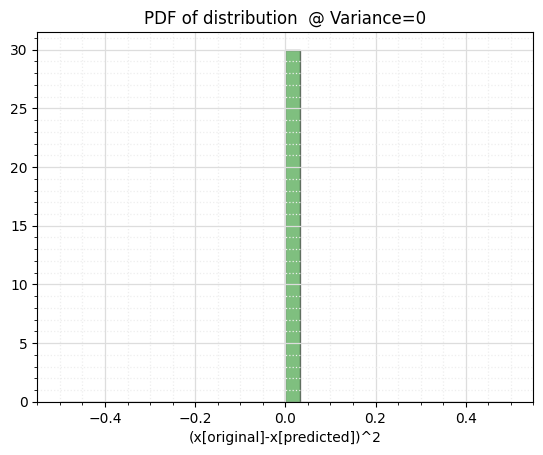

In [103]:
gaussian_noise = np.random.normal(mean, 0, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

count, bins, ignored = plt.hist(sq_diff_numbers, 30, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=0")
plt.show()

In [104]:
gaussian_noise = np.random.normal(mean, 45, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

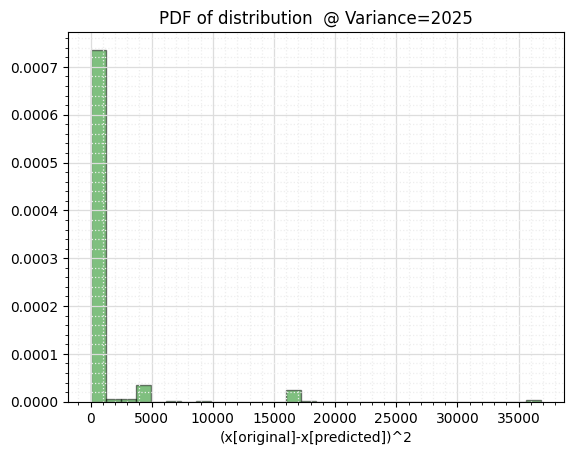

In [108]:
count, bins, ignored = plt.hist(sq_diff_numbers, 30, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=2025")
plt.show()

In [109]:
gaussian_noise = np.random.normal(mean, 78, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

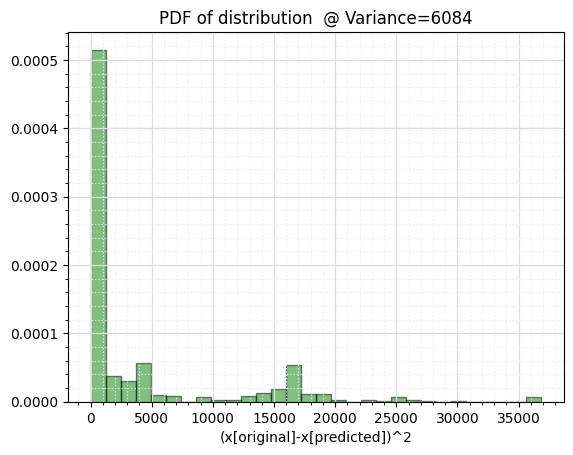

In [110]:
count, bins, ignored = plt.hist(sq_diff_numbers, 30, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=6084")
plt.show()

In [111]:
gaussian_noise = np.random.normal(mean, 100, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

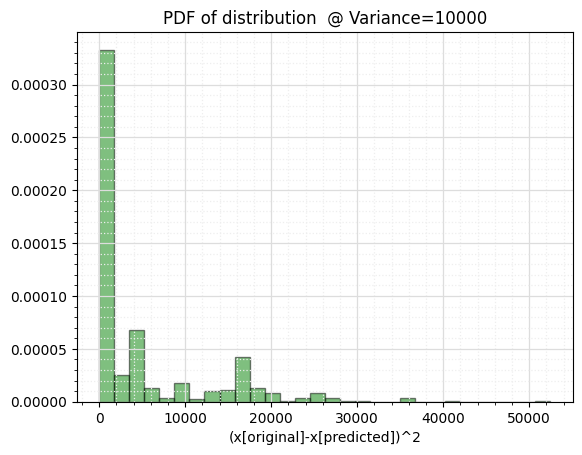

In [112]:
count, bins, ignored = plt.hist(sq_diff_numbers, 30, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=10000")
plt.show()

In [113]:
gaussian_noise = np.random.normal(mean, 1000, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

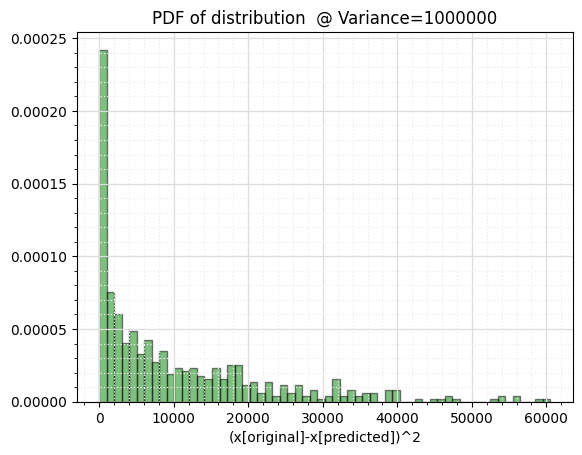

In [115]:
count, bins, ignored = plt.hist(sq_diff_numbers, 60, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=1000000")
plt.show()

In [19]:
gaussian_noise = np.random.normal(mean, 10000, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

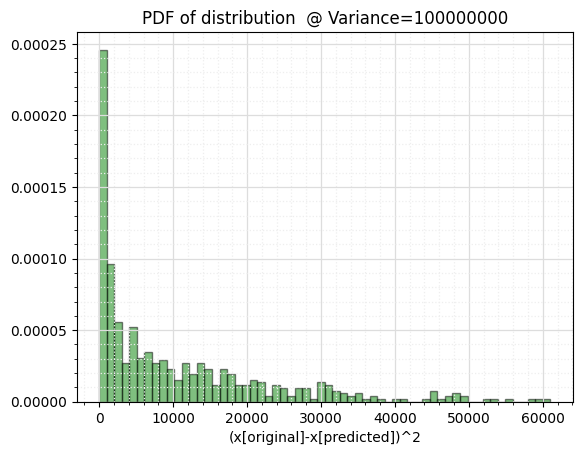

In [22]:
count, bins, ignored = plt.hist(sq_diff_numbers, 60, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=100000000")
plt.show()

In [23]:
gaussian_noise = np.random.normal(mean, 1000000000000, num_samples)

xr = gaussian_noise + xcc

y1,y2 = AnalogDemod(xr,fs,fc,Bw)

output_pulse0_even, output_pulse1_even, predicted_even_sequence = MatchedFilt(y1, pulse_0, pulse_1)
output_pulse0_odd, output_pulse1_odd, predicted_odd_sequence = MatchedFilt(y2, pulse_0, pulse_1)

predicted_sequence = Combine(predicted_even_sequence, predicted_odd_sequence)
predicted_seq_numbers = OutputDecoder(predicted_sequence)
diff_numbers = -predicted_seq_numbers+original_seq_numbers
sq_diff_numbers = np.power(diff_numbers, 2)

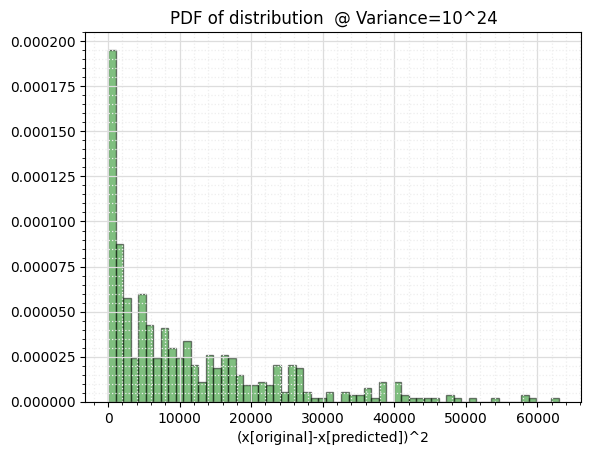

In [24]:
count, bins, ignored = plt.hist(sq_diff_numbers, 60, density=True, alpha=0.5, color='g', edgecolor='black')
plt.xlabel('(x[original]-x[predicted])^2')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.title("PDF of distribution  @ Variance=10^24")
plt.show()

In [27]:
print("Variance Of distribution @ Variance=10^24 : ",np.var(sq_diff_numbers))

Variance Of distribution @ Variance=10^24 :  146695983.6934662


. <hr> <hr> <hr> <hr>


# <font color='red'>Part5: Compander </font>

## <font color='Green'> 5.1 </font>:

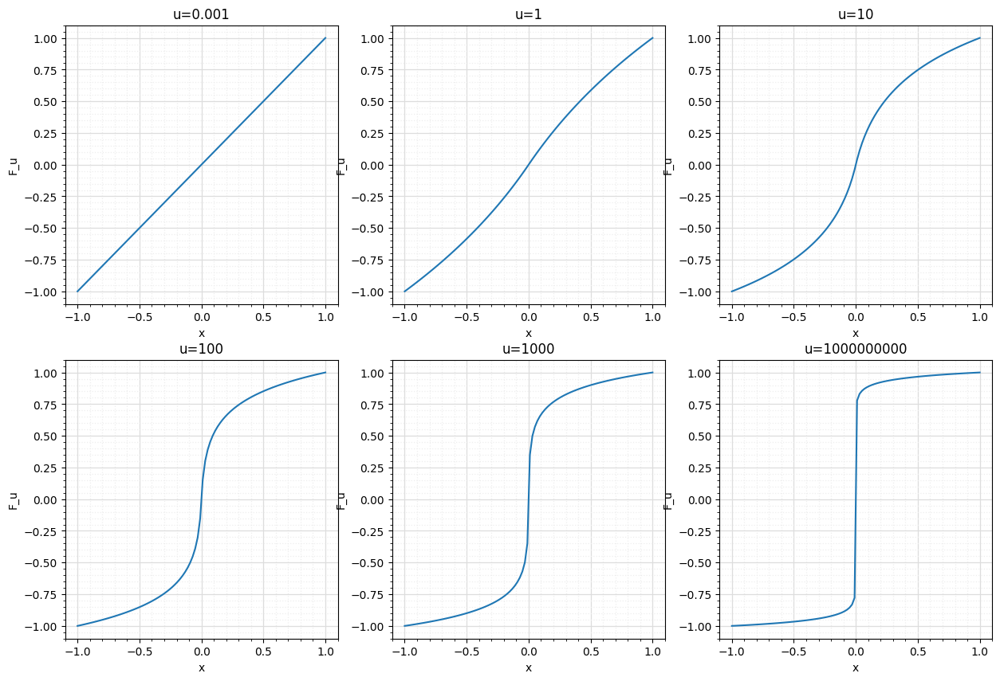

In [28]:
x = np.linspace(-1,1,100)

plt.figure(figsize=(15,10))
plt.axis(False)
plt.subplot(2,3,1)
u = 0.001
F = (x/np.abs(x))*(np.log(1+u*np.abs(x)))/np.log(1+u)

plt.plot(x, F)
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=0.001')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

plt.subplot(2,3,2)
u = 1
F = (x/np.abs(x))*(np.log(1+u*np.abs(x)))/np.log(1+u)

plt.plot(x, F)
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=1')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

plt.subplot(2,3,3)
u = 10
F = (x/np.abs(x))*(np.log(1+u*np.abs(x)))/np.log(1+u)

plt.plot(x, F)
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=10')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

plt.subplot(2,3,4)
u = 100
F = (x/np.abs(x))*(np.log(1+u*np.abs(x)))/np.log(1+u)

plt.plot(x, F)
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=100')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

plt.subplot(2,3,5)
u = 1000
F = (x/np.abs(x))*(np.log(1+u*np.abs(x)))/np.log(1+u)

plt.plot(x, F)
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=1000')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

plt.subplot(2,3,6)
u = 1000000000
F = (x/np.abs(x))*(np.log(1+u*np.abs(x)))/np.log(1+u)

plt.plot(x, F)
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=1000000000')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

## <font color='Green'> 5.2 </font>:


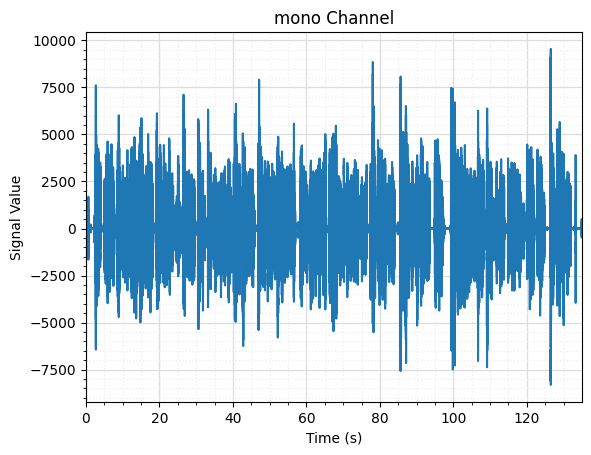

In [59]:
import wave
import sounddevice as sd

wav_obj = wave.open('CS_Project_400109768.wav', 'rb')


sample_freq = wav_obj.getframerate()
n_samples = wav_obj.getnframes()
t_audio = n_samples/sample_freq
n_channels = wav_obj.getnchannels()
signal_wave = wav_obj.readframes(n_samples)
signal_array = np.frombuffer(signal_wave, dtype=np.int16)
l_channel = signal_array[0::2]
r_channel = signal_array[1::2]
mono = (l_channel+r_channel)/2
times = np.linspace(0, n_samples/sample_freq, num=n_samples)


# plot m(t)
plt.plot(times, mono)
plt.title('mono Channel')
plt.ylabel('Signal Value')
plt.xlabel('Time (s)')
plt.xlim(0, t_audio)
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.show()


In [63]:
print(sample_freq)
# Play the audio signal
sd.play(mono, 10000)
sd.wait()

48000


## <font color='Green'> 5.3 </font>:


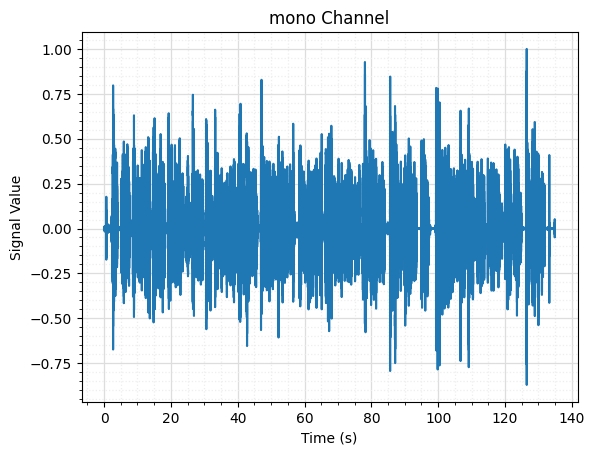

Power : -21.317819489140106  dB


In [60]:
mono = mono/np.max(np.abs(mono))

# plot m(t)
plt.plot(times, mono)
plt.title('mono Channel')
plt.ylabel('Signal Value')
plt.xlabel('Time (s)')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.show()

P = np.mean(np.square(mono))
P_dB = 10 * np.log10(P)

print("Power :",P_dB," dB")


## <font color='Green'> 5.4 </font>:


In [31]:
def compressor_ulaw(x, u):
    return np.sign(x)*(np.log(1+u*np.abs(x)))/np.log(1+u)

## <font color='Green'> 5.5 </font>:


In [61]:
def expander_ulaw(F, u):
    return (np.power(1+u, np.abs(F))-1)*np.sign(F)/u

**test:**

(0.0, 20.0)

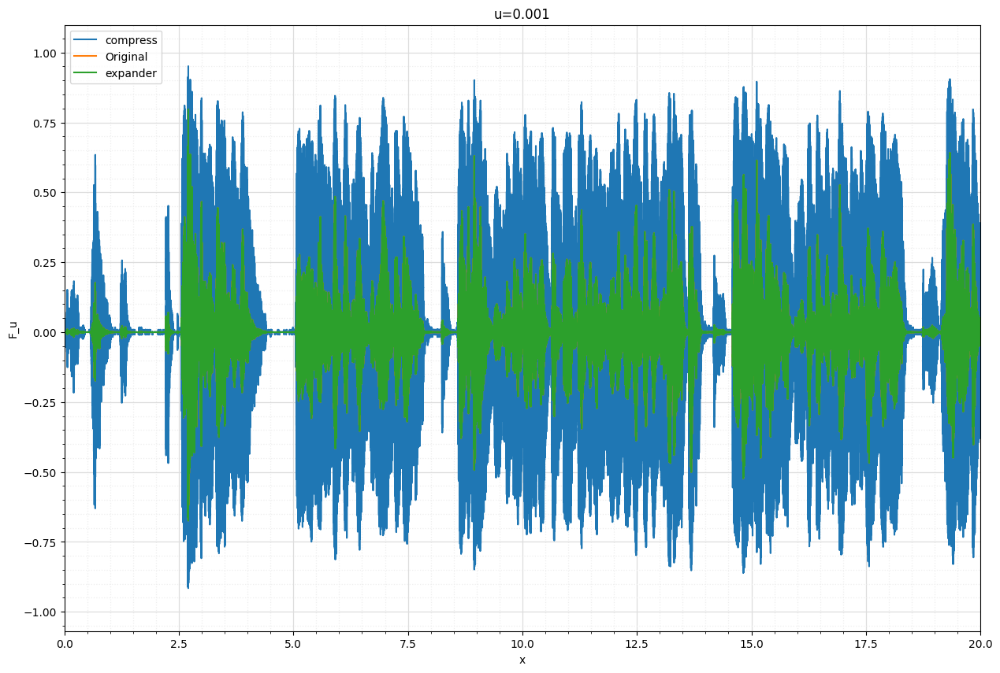

In [62]:
plt.figure(figsize=(15,10))
u = 100
F = compressor_ulaw(mono, u)
new_x =expander_ulaw(F, u)

plt.plot(times, F, label='compress')
plt.plot(times, mono, label='Original')
plt.plot(times, new_x, label='expander')
plt.legend()
plt.xlabel('x')
plt.ylabel('F_u')
plt.title('u=0.001')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
plt.xlim([0,20])

## <font color='Green'> 5.6 </font>:

In [35]:
def calc_rms_error(Original_signal, new_signal):
    error_signal = Original_signal - new_signal
    rms_error = np.sqrt(np.mean(error_signal**2))
    return rms_error

In [63]:


N = 6
u_array = [0.00001,0.01,1,10,100,1000]
rms_error_array = np.zeros(N)
print("first compressor last expander:")
for i in range(N):
    new_x = expander_ulaw(compressor_ulaw(mono, u_array[i]), u_array[i])
    rms_error_array[i] = calc_rms_error(mono, new_x)
    print("RMS @ u=",u_array[i]," : ",rms_error_array[i])

print()
print("first expander last compressor:")
for i in range(N):
    new_x = compressor_ulaw(expander_ulaw(mono, u_array[i]), u_array[i])
    rms_error_array[i] = calc_rms_error(mono, new_x)
    print("RMS @ u=",u_array[i]," : ",rms_error_array[i])



first compressor last expander:
RMS @ u= 1e-05  :  6.076270252108417e-12
RMS @ u= 0.01  :  5.99841234348738e-15
RMS @ u= 1  :  6.133066343189531e-17
RMS @ u= 10  :  1.6345349359798187e-17
RMS @ u= 100  :  2.3889448282130827e-17
RMS @ u= 1000  :  3.1941911461641387e-17

first expander last compressor:
RMS @ u= 1e-05  :  5.892832009307901e-12
RMS @ u= 0.01  :  6.120157004359347e-15
RMS @ u= 1  :  8.338069236633469e-17
RMS @ u= 10  :  2.3005657662073195e-17
RMS @ u= 100  :  1.3086850370673705e-17
RMS @ u= 1000  :  9.249388224696409e-18


## <font color='Green'> 5.7 </font>:


In [46]:
def quantizer(signal, levels):
    # Quantize the signal uniformly
    quantized_signal = (np.floor(((signal + 1) /2) * (levels)) / (levels)) * 2 - 1

    return quantized_signal


**test:**

D:\_University_s5\_FULLy\Communication_Systems\Project\Project\venv\lib\site-packages\IPython\core\events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
D:\_University_s5\_FULLy\Communication_Systems\Project\Project\venv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


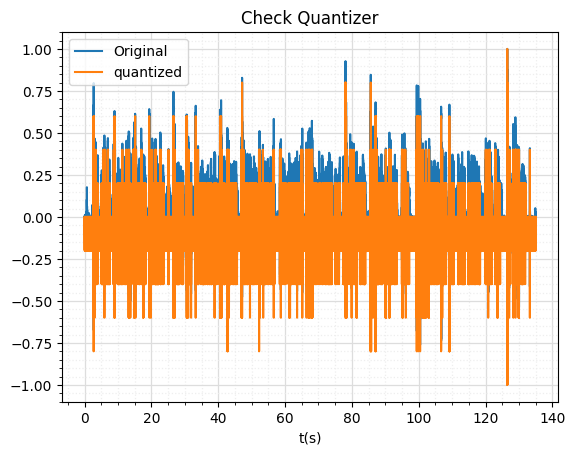

In [64]:

q_x = quantizer(mono,10)

plt.plot(times, mono, label='Original')
plt.plot(times, q_x, label='quantized')

plt.legend()
plt.xlabel('t(s)')
plt.title('Check Quantizer')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

## <font color='Green'> 5.8 </font>:

In [50]:
def calc_snr(original_signal, new_signal):
    # Calculate the signal power
    signal_power = np.mean(np.array(original_signal)**2)

    # Calculate the noise power
    noise_power = np.mean(np.array(original_signal-new_signal)**2)

    # Compute the SNR in decibels
    snr = 10 * np.log10(signal_power / noise_power)

    return snr

In [71]:
L = [4,5,6,7,8]
qx_array = np.zeros((len(L),len(mono)))
snr_array = np.zeros(len(L))

for i in range(len(L)):
    qx_array[i,:] = quantizer(mono,L[i])
    snr_array[i] = calc_snr(mono, qx_array[i,:])
    print("SNR @ L=",L[i]," : ",round(snr_array[i], 2)," dB")

SNR @ L= 4  :  -11.16  dB
SNR @ L= 5  :  -7.78  dB
SNR @ L= 6  :  -7.42  dB
SNR @ L= 7  :  -5.02  dB
SNR @ L= 8  :  -4.77  dB


## <font color='Green'> 5.9 </font>:


In [72]:
def System_CQE(original_signal, u, L):
    x_compressed = compressor_ulaw(original_signal, u)
    x_quantized_compressed = quantizer(x_compressed, L)
    x_quantized = expander_ulaw(x_quantized_compressed, u)
    return x_quantized

In [73]:
u_array = [0.1, 0.5, 1, 2, 5, 10]
L = [4,5,6,7,8]

for j in range(len(u_array)):
    qx_array_CQE = np.zeros((len(L),len(mono)))
    for i in range(len(L)):
        qx_array_CQE[i,:] = System_CQE(mono, u_array[j], L[i])
        snr_array[i] = calc_snr(mono, qx_array_CQE[i,:])
        print("SNR @ [L=",L[i],"] & [u=",u_array[j],"] : ",round(snr_array[i], 2)," dB")
    print("________")

SNR @ [L= 4 ] & [u= 0.1 ] :  -10.94  dB
SNR @ [L= 5 ] & [u= 0.1 ] :  -7.48  dB
SNR @ [L= 6 ] & [u= 0.1 ] :  -7.12  dB
SNR @ [L= 7 ] & [u= 0.1 ] :  -4.71  dB
SNR @ [L= 8 ] & [u= 0.1 ] :  -4.45  dB
________
SNR @ [L= 4 ] & [u= 0.5 ] :  -10.18  dB
SNR @ [L= 5 ] & [u= 0.5 ] :  -6.5  dB
SNR @ [L= 6 ] & [u= 0.5 ] :  -6.13  dB
SNR @ [L= 7 ] & [u= 0.5 ] :  -3.68  dB
SNR @ [L= 8 ] & [u= 0.5 ] :  -3.36  dB
________
SNR @ [L= 4 ] & [u= 1 ] :  -9.43  dB
SNR @ [L= 5 ] & [u= 1 ] :  -5.62  dB
SNR @ [L= 6 ] & [u= 1 ] :  -5.18  dB
SNR @ [L= 7 ] & [u= 1 ] :  -2.74  dB
SNR @ [L= 8 ] & [u= 1 ] :  -2.32  dB
________
SNR @ [L= 4 ] & [u= 2 ] :  -8.32  dB
SNR @ [L= 5 ] & [u= 2 ] :  -4.46  dB
SNR @ [L= 6 ] & [u= 2 ] :  -3.81  dB
SNR @ [L= 7 ] & [u= 2 ] :  -1.44  dB
SNR @ [L= 8 ] & [u= 2 ] :  -0.88  dB
________
SNR @ [L= 4 ] & [u= 5 ] :  -6.4  dB
SNR @ [L= 5 ] & [u= 5 ] :  -2.87  dB
SNR @ [L= 6 ] & [u= 5 ] :  -1.67  dB
SNR @ [L= 7 ] & [u= 5 ] :  0.49  dB
SNR @ [L= 8 ] & [u= 5 ] :  1.31  dB
________
SNR @ [L= 4 

## <font color='Green'> 5.10 </font>:


In [ ]:
L = 6
u_array = np.linspace(0.1,30,30)
snr_array = np.zeros(len(u_array))
qx_array_CQE = np.zeros(len(mono))

for i in range(len(u_array)):
    print(i)
    qx_array_CQE = System_CQE(mono, u_array[i], L)
    snr_array[i] = calc_snr(mono, qx_array_CQE)

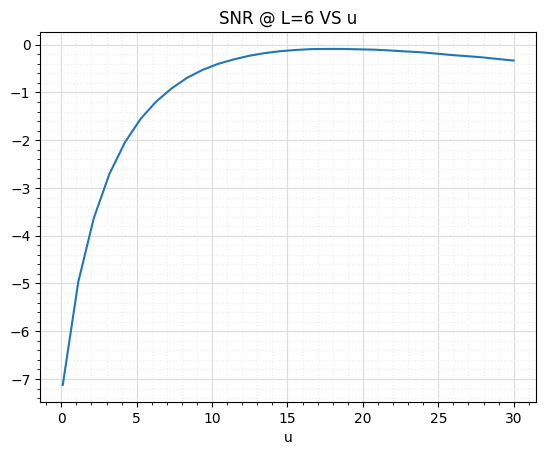

In [68]:
plt.plot(u_array, snr_array)
plt.xlabel('u')
plt.title('SNR @ L=6 VS u')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()

## <font color='Green'> 5.11 </font>:


In [75]:
def System_EQC(original_signal, u, L):
    x_expanded = expander_ulaw(original_signal, u)
    x_quantized_expanded = quantizer(x_expanded, L)
    x_quantized = compressor_ulaw(x_quantized_expanded, u)
    return x_quantized

In [76]:
u_array = [0.1, 0.5, 1, 2, 5, 10]
L = [4,5,6,7,8]

for j in range(len(u_array)):
    qx_array_EQC = np.zeros((len(L),len(mono)))
    for i in range(len(L)):
        qx_array_EQC[i,:] = System_EQC(mono, u_array[j], L[i])
        snr_array[i] = calc_snr(mono, qx_array_EQC[i,:])
        print("SNR @ [L=",L[i],"] & [u=",u_array[j],"] : ",round(snr_array[i], 2)," dB")
    print("________")

SNR @ [L= 4 ] & [u= 0.1 ] :  -11.38  dB
SNR @ [L= 5 ] & [u= 0.1 ] :  -8.08  dB
SNR @ [L= 6 ] & [u= 0.1 ] :  -7.71  dB
SNR @ [L= 7 ] & [u= 0.1 ] :  -5.33  dB
SNR @ [L= 8 ] & [u= 0.1 ] :  -5.09  dB
________
SNR @ [L= 4 ] & [u= 0.5 ] :  -12.04  dB
SNR @ [L= 5 ] & [u= 0.5 ] :  -9.08  dB
SNR @ [L= 6 ] & [u= 0.5 ] :  -8.63  dB
SNR @ [L= 7 ] & [u= 0.5 ] :  -6.38  dB
SNR @ [L= 8 ] & [u= 0.5 ] :  -6.14  dB
________
SNR @ [L= 4 ] & [u= 1 ] :  -12.61  dB
SNR @ [L= 5 ] & [u= 1 ] :  -10.01  dB
SNR @ [L= 6 ] & [u= 1 ] :  -9.44  dB
SNR @ [L= 7 ] & [u= 1 ] :  -7.38  dB
SNR @ [L= 8 ] & [u= 1 ] :  -7.08  dB
________
SNR @ [L= 4 ] & [u= 2 ] :  -13.3  dB
SNR @ [L= 5 ] & [u= 2 ] :  -11.28  dB
SNR @ [L= 6 ] & [u= 2 ] :  -10.49  dB
SNR @ [L= 7 ] & [u= 2 ] :  -8.81  dB
SNR @ [L= 8 ] & [u= 2 ] :  -8.35  dB
________
SNR @ [L= 4 ] & [u= 5 ] :  -14.25  dB
SNR @ [L= 5 ] & [u= 5 ] :  -13.24  dB
SNR @ [L= 6 ] & [u= 5 ] :  -11.99  dB
SNR @ [L= 7 ] & [u= 5 ] :  -11.12  dB
SNR @ [L= 8 ] & [u= 5 ] :  -10.24  dB
________

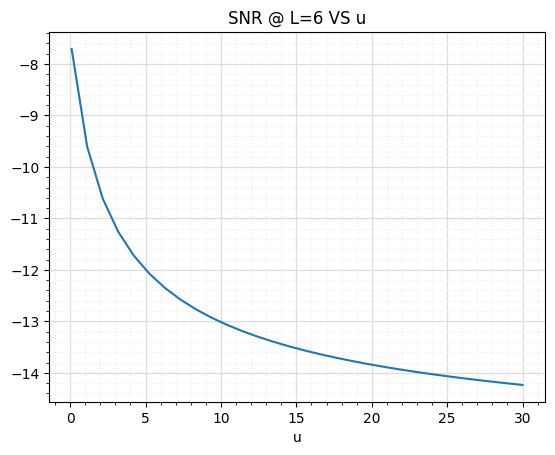

In [77]:
L = 6
u_array = np.linspace(0.1,30,30)
snr_array = np.zeros(len(u_array))
qx_array_EQC = np.zeros(len(mono))

for i in range(len(u_array)):
    qx_array_EQC = System_EQC(mono, u_array[i], L)
    snr_array[i] = calc_snr(mono, qx_array_EQC)

plt.plot(u_array, snr_array)
plt.xlabel('u')
plt.title('SNR @ L=6 VS u')
plt.grid(which='major', color='#DDDDDD', linewidth=0.9)
plt.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.9)
plt.minorticks_on()
